In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from scipy import stats
from ucimlrepo import fetch_ucirepo 
import time
from itertools import product

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV

from sklearn.decomposition import PCA
from scipy.stats import kurtosis
from sklearn.decomposition import FastICA
from sklearn.random_projection import SparseRandomProjection, GaussianRandomProjection
from sklearn.manifold import Isomap
from sklearn import manifold

from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree

from multiprocessing import Pool

In [112]:
data_name = 'Default'
case = ''

In [83]:
# fetch dataset 
default_of_credit_card_clients = fetch_ucirepo(id=350) 
  
# data (as pandas dataframes) 
X_df = default_of_credit_card_clients.data.features 
y_df = default_of_credit_card_clients.data.targets 
  
# metadata 
#print(default_of_credit_card_clients.metadata) 
  
# variable information 
print(default_of_credit_card_clients.variables) 

print(X_df)
print(y_df)

   name     role     type      demographic                 description units  \
0    ID       ID  Integer             None                        None  None   
1    X1  Feature  Integer             None                   LIMIT_BAL  None   
2    X2  Feature  Integer              Sex                         SEX  None   
3    X3  Feature  Integer  Education Level                   EDUCATION  None   
4    X4  Feature  Integer   Marital Status                    MARRIAGE  None   
5    X5  Feature  Integer              Age                         AGE  None   
6    X6  Feature  Integer             None                       PAY_0  None   
7    X7  Feature  Integer             None                       PAY_2  None   
8    X8  Feature  Integer             None                       PAY_3  None   
9    X9  Feature  Integer             None                       PAY_4  None   
10  X10  Feature  Integer             None                       PAY_5  None   
11  X11  Feature  Integer             No

In [84]:
print('X2: Gender (1 = male; 2 = female)')
print(X_df.groupby(['X2'])['X2'].count())

print('X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others)')
print(X_df.groupby(['X3'])['X3'].count())

print('X4: Marital status (1 = married; 2 = single; 3 = others)')
print(X_df.groupby(['X4'])['X4'].count())

print('Target: default payment (Yes = 1, No = 0)')
print(y_df.groupby(['Y'])['Y'].count())

#########

X_df['X3'].values[X_df['X3'].values >= 4] = 4
X_df['X3'].values[X_df['X3'].values == 0] = 4

X_df['X4'].values[X_df['X4'].values == 0] = 3

print('X2: Gender (1 = male; 2 = female)')
print(X_df.groupby(['X2'])['X2'].count())

print('X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others)')
print(X_df.groupby(['X3'])['X3'].count())

print('X4: Marital status (1 = married; 2 = single; 3 = others)')
print(X_df.groupby(['X4'])['X4'].count())

X2: Gender (1 = male; 2 = female)
X2
1    11888
2    18112
Name: X2, dtype: int64
X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others)
X3
0       14
1    10585
2    14030
3     4917
4      123
5      280
6       51
Name: X3, dtype: int64
X4: Marital status (1 = married; 2 = single; 3 = others)
X4
0       54
1    13659
2    15964
3      323
Name: X4, dtype: int64
Target: default payment (Yes = 1, No = 0)
Y
0    23364
1     6636
Name: Y, dtype: int64
X2: Gender (1 = male; 2 = female)
X2
1    11888
2    18112
Name: X2, dtype: int64
X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others)
X3
1    10585
2    14030
3     4917
4      468
Name: X3, dtype: int64
X4: Marital status (1 = married; 2 = single; 3 = others)
X4
1    13659
2    15964
3      377
Name: X4, dtype: int64


In [85]:
data_df = pd.concat([X_df, y_df], axis=1)
# count the duplicated cases
data_df.duplicated().sum
data_df = data_df.drop_duplicates()
data_df.reset_index(drop=True,inplace=True)
data_df['Y'].value_counts()

Y
0    23335
1     6630
Name: count, dtype: int64

<Axes: >

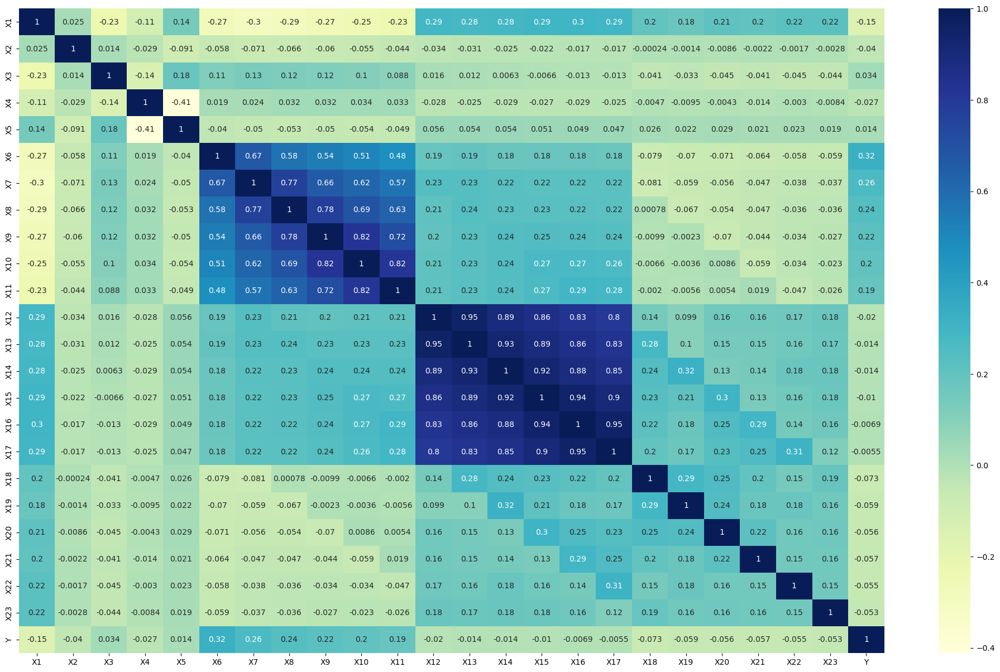

In [7]:
fig, ax = plt.subplots(figsize=(25,15))
sns.heatmap(data_df.corr(),annot=True,cmap="YlGnBu" , ax=ax)

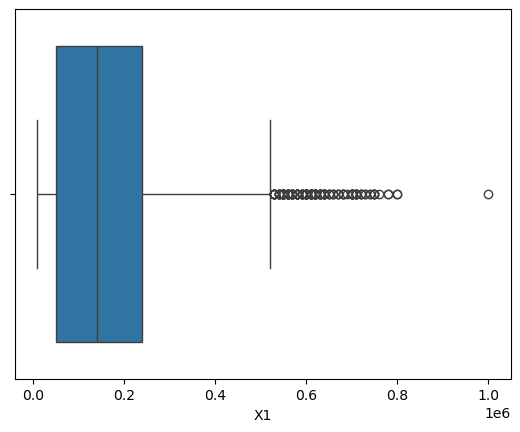

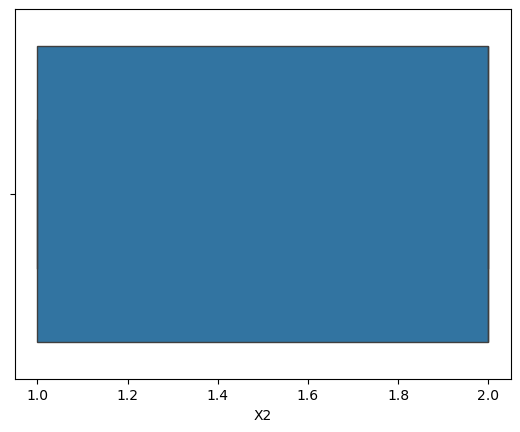

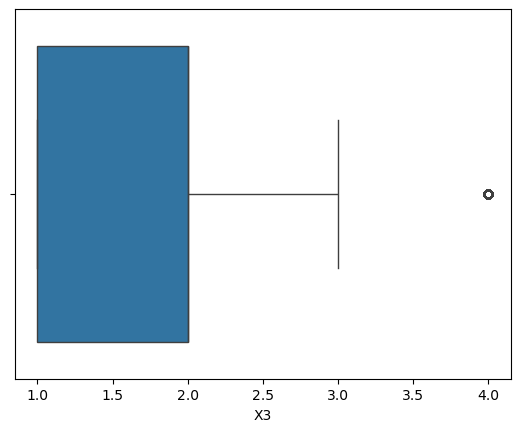

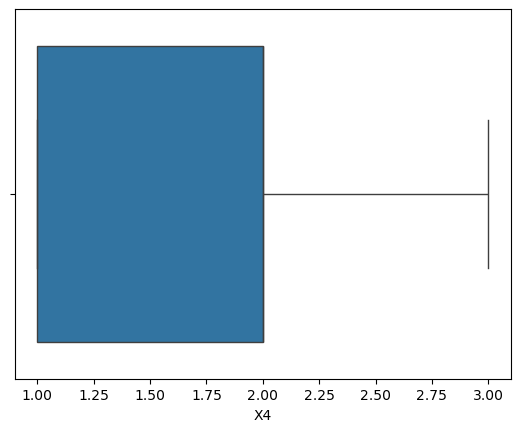

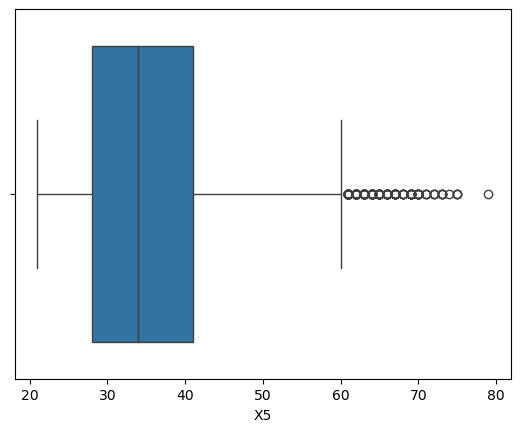

...

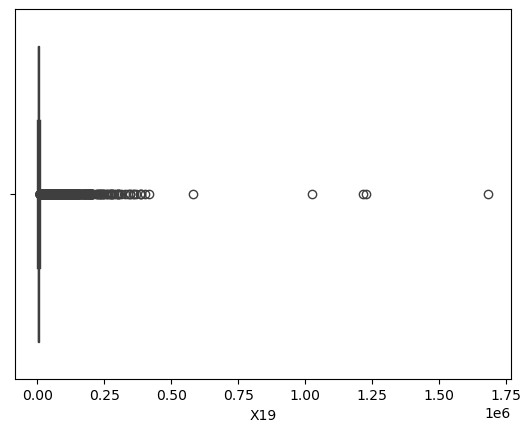

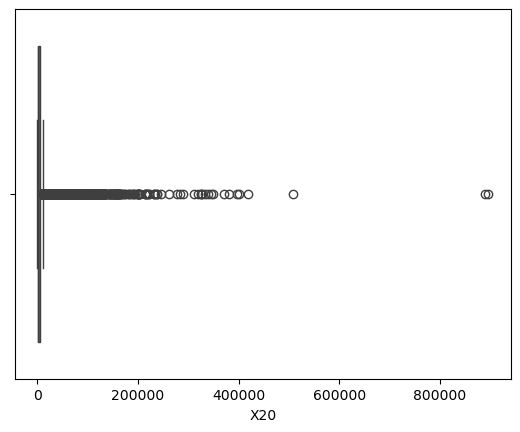

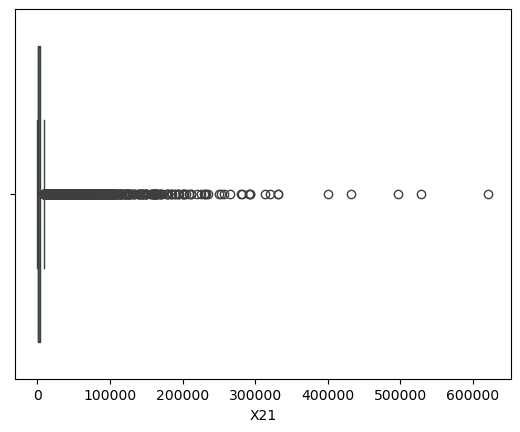

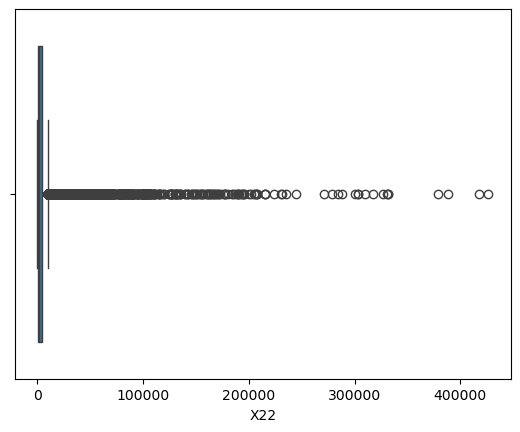

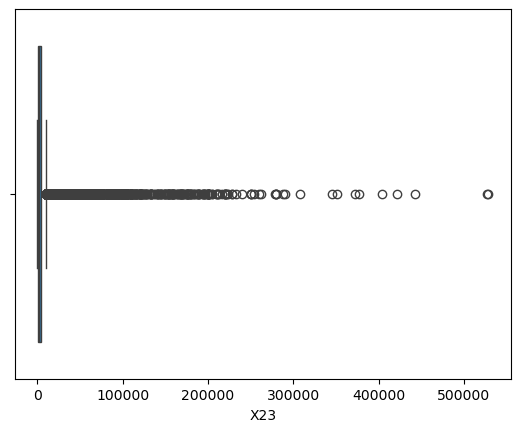

In [8]:
# Box plots for outliers
i = 0
for x in X_df.columns:
    i += 1
    plt.figure(i)
    sns.boxplot(x=X_df[x])
    plt.show()
    plt.close()

TypeError: close() argument must be a Figure, an int, a string, or None, not <class 'seaborn.axisgrid.PairGrid'>

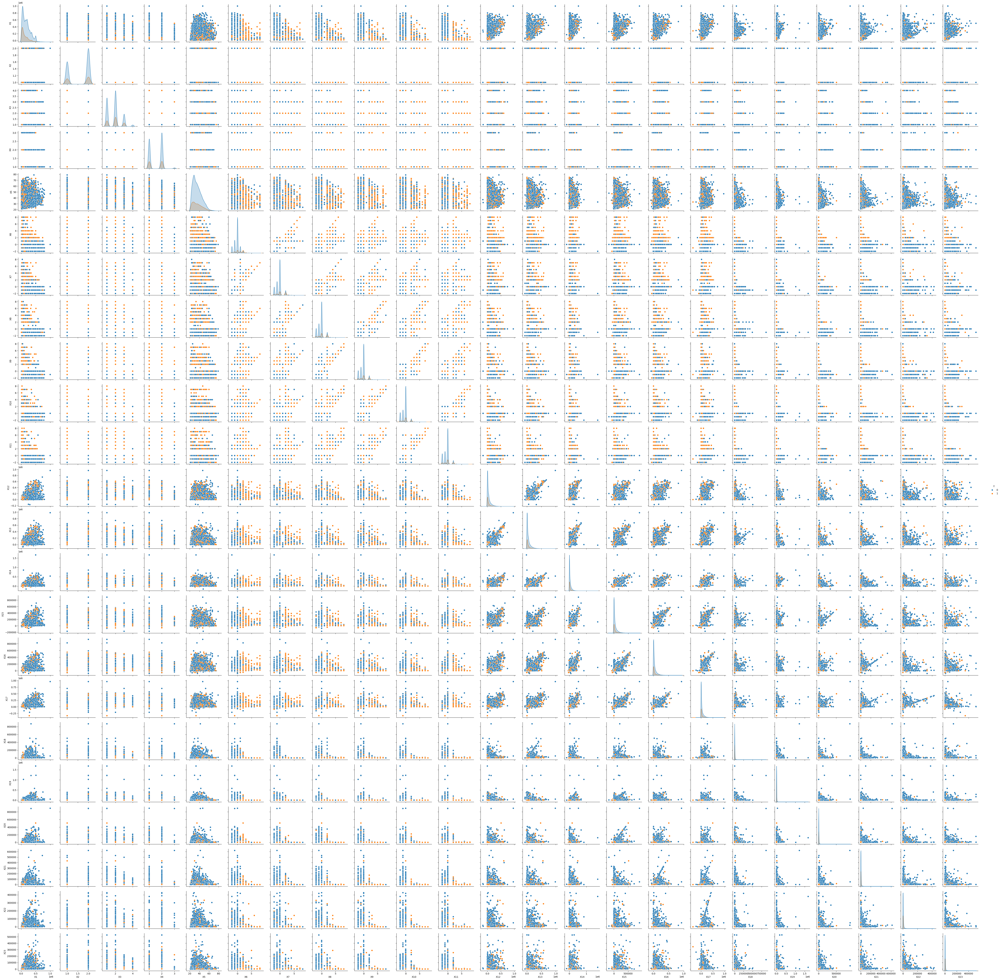

In [45]:
fig = sns.pairplot(data_df, hue='Y')
fig.savefig('pair_plot.png')
plt.close()

In [87]:
#for col in list(X_df.columns):
#
#    # Calculate quantiles
#    Q1 = data_df[col].quantile(0.25)
#    Q3 = data_df[col].quantile(0.75)
#    IQR = Q3 - Q1
#    # Calculate upper and lower bounds
#    upper_bound = Q3 + 1.5 * IQR
#    lower_bound = Q1 - 1.5 * IQR
#    # Identify outliers
#    outliers = data_df[(data_df[col] > upper_bound) | (data_df[col] < lower_bound)]
#    # Remove outliers
#    data_df = data_df[(data_df[col] <= upper_bound) & (data_df[col] >= lower_bound)]
#
#data_df.reset_index(inplace=True, drop=True)
#
#print('Data counts without the outliers')
#print(data_df.groupby(['Y'])['Y'].count())

In [88]:
data_df

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X15,X16,X17,X18,X19,X20,X21,X22,X23,Y
0,20000,2,2,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
1,120000,2,2,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,2,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,2,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,1,2,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29960,220000,1,3,1,39,0,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29961,150000,1,3,2,43,-1,-1,-1,-1,0,...,8979,5190,0,1837,3526,8998,129,0,0,0
29962,30000,1,2,2,37,4,3,2,-1,0,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29963,80000,1,3,1,41,1,-1,0,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [89]:
# Use one-hot-encoding for the categorical feature: X4 {1,2,3}
enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(data_df[['X4']])
print(enc.categories_)
enc_features_names = enc.get_feature_names_out(['X4'])
enc_features = enc.transform(data_df[['X4']]).toarray()
enc_features_df = pd.DataFrame(enc_features, columns=enc_features_names)

# Feature df
X_df = pd.concat([data_df, enc_features_df], axis=1)
X_df.drop(['X4','Y'], axis=1, inplace=True)

X = X_df.values
y = data_df['Y'].values

[array([1, 2, 3], dtype=int64)]


In [90]:
X.shape

(29965, 25)

In [91]:
seed = 903946366

# Shuffle data and then split into the training and the test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, shuffle = True, random_state = seed, 
                                                    stratify = y)

# Standardize data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_train_orig = X_train
X_test_orig = X_test


In [92]:
# FIND the feature matrix rank
np.linalg.matrix_rank(X)

25

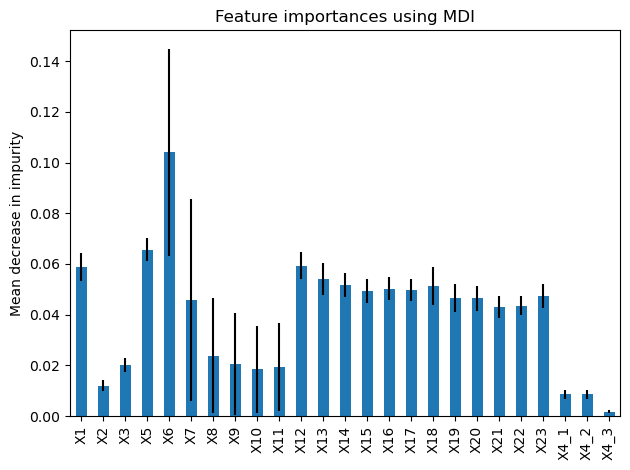

In [93]:
# Feature importance through random forest
forest = RandomForestClassifier(random_state=seed)
forest.fit(X_train, y_train)

importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)

forest_importances = pd.Series(importances, index=X_df.columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()
plt.show()
plt.close(fig)

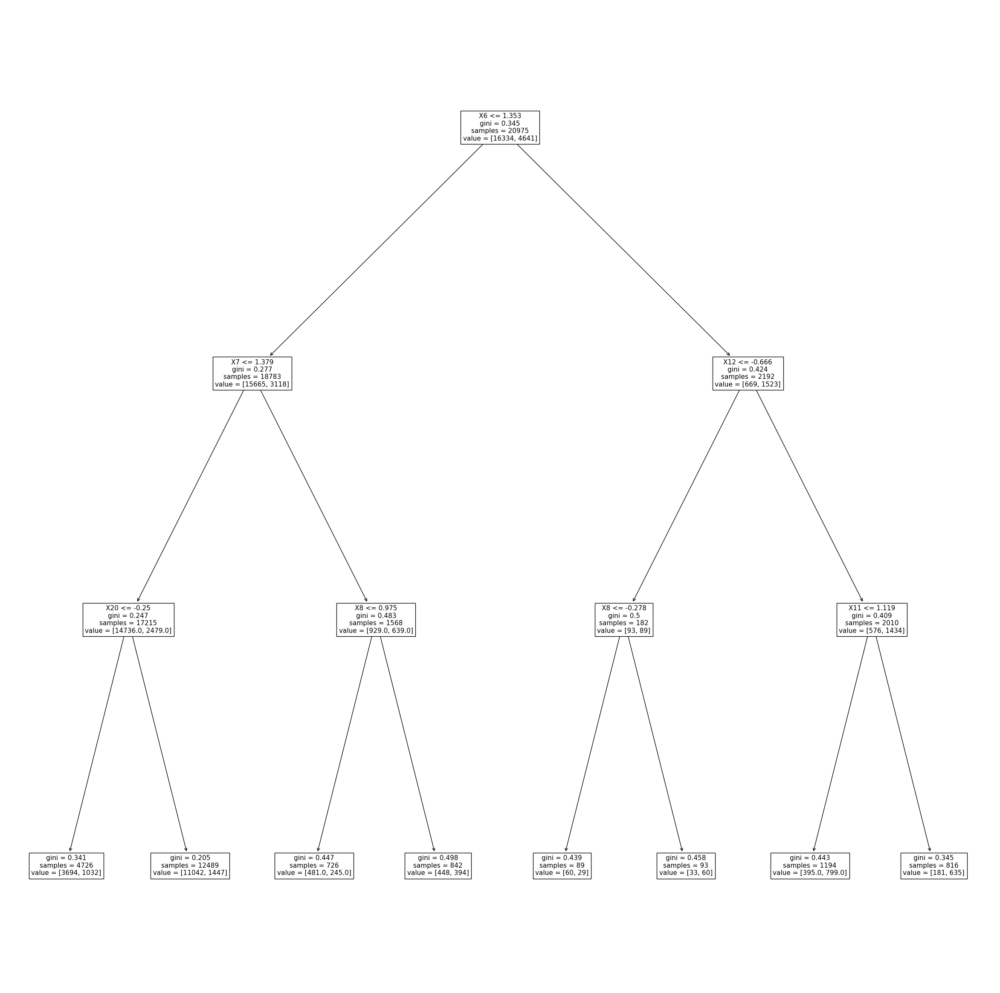

   feature  importance
4       X6    0.772918
5       X7    0.140532
18     X20    0.050728
6       X8    0.015874
10     X12    0.011836
9      X11    0.008111
0       X1    0.000000
15     X17    0.000000
23    X4_2    0.000000
22    X4_1    0.000000
21     X23    0.000000
20     X22    0.000000
19     X21    0.000000
17     X19    0.000000
16     X18    0.000000
12     X14    0.000000
14     X16    0.000000
13     X15    0.000000
1       X2    0.000000
11     X13    0.000000
8      X10    0.000000
7       X9    0.000000
3       X5    0.000000
2       X3    0.000000
24    X4_3    0.000000


In [106]:
# Decision tree classifier

clf = DecisionTreeClassifier(max_depth=3, random_state=seed)
clf.fit(X_train, y_train)
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

fig = plt.figure(figsize=(30,30))
plot_tree(clf, feature_names = list(X_df.columns), fontsize=11)
plt.show()
fig.savefig('DT-max_depth-3.png')
plt.close(fig)

# Get feature importances
importances = clf.feature_importances_

# Create a dataframe to display feature importances
feature_names = X_df.columns
feature_importances = pd.DataFrame({'feature': feature_names, 'importance': importances})

# Sort the dataframe by importance in descending order
feature_importances.sort_values(by='importance', ascending=False, inplace=True)

print(feature_importances)


In [95]:
def kmeans_tuning(X_train, max_clusters, seed):
    range_n_clusters = list(range(2, max_clusters+1))
    inertias = []
    silhouette_avg_scores = []
    ch_scores = []
    
    for n_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=n_clusters, random_state=seed, init="k-means++", max_iter=1000, n_init=20)
        cluster_labels = kmeans.fit_predict(X_train)
        inertias.append(kmeans.inertia_)
        silhouette_avg_scores.append(silhouette_score(X_train, cluster_labels))
        ch_scores.append(metrics.calinski_harabasz_score(X_train, cluster_labels))
    return inertias, silhouette_avg_scores, ch_scores

In [148]:
inertias, silhouette_avg_scores, ch_scores = kmeans_tuning(X_train_orig, 20, seed)

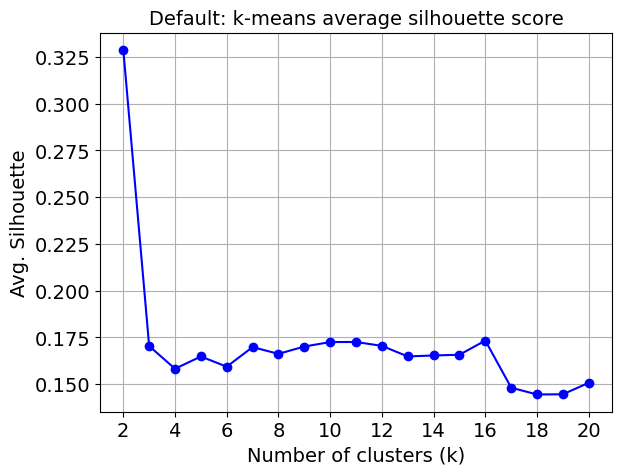

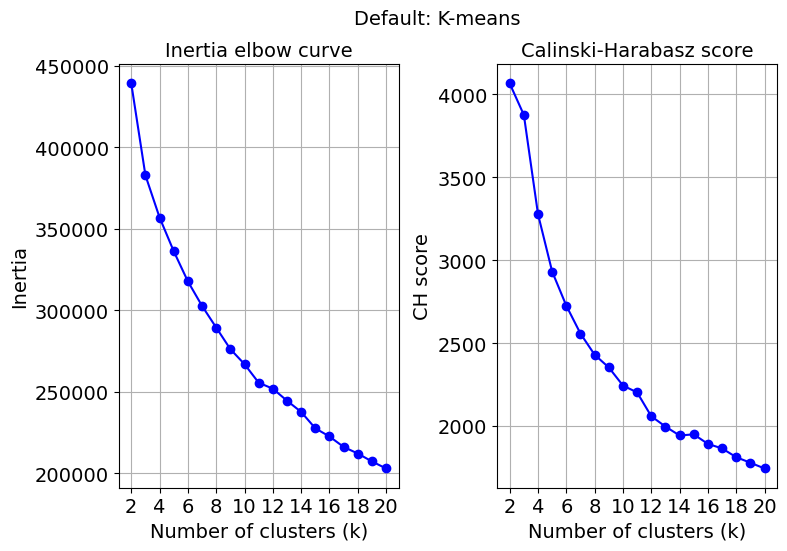

In [151]:
#inertias, silhouette_avg_scores = kmeans_tuning(X_train, 20, seed)
max_clusters = 20
range_n_clusters = list(range(2, max_clusters+1))

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range_n_clusters, silhouette_avg_scores,'-o', color='b')

ax.tick_params(labelsize=fontsize)
ax.set_title('Default: k-means average silhouette score', fontsize=fontsize)
ax.set_xlabel('Number of clusters (k)', fontsize=fontsize) 
ax.set_ylabel('Avg. Silhouette', fontsize=fontsize)
ax.set_xticks(range(2,22,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
fig.savefig('Default_kmeans_silhouette.png')
plt.close(fig)


fontsize = 14
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, sharex=True, figsize=(8.5, 5.5))
#ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax1.plot(range_n_clusters, inertias,'-o', color='b')

ax1.tick_params(labelsize=fontsize)
ax1.set_title('Inertia elbow curve', fontsize=fontsize)
ax1.set_xlabel('Number of clusters (k)', fontsize=fontsize) 
ax1.set_ylabel('Inertia', fontsize=fontsize)
ax1.set_xticks(range(2,22,2))
#plt.rcParams['axes.titley'] = 1.0
ax1.grid(True)
#plt.show()

#fontsize = 14
#fig = plt.figure()
#ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax2.plot(range_n_clusters, ch_scores,'-o', color='b')
ax2.tick_params(labelsize=fontsize)
ax2.set_title('Calinski-Harabasz score', fontsize=fontsize)
ax2.set_xlabel('Number of clusters (k)', fontsize=fontsize) 
ax2.set_ylabel('CH score', fontsize=fontsize)
ax2.set_xticks(range(2,22,2))
#plt.rcParams['axes.titley'] = 1.0
ax2.grid(True)
fig.suptitle('Default: K-means', fontsize=fontsize) 
fig.subplots_adjust(wspace=0.35)
fig.savefig('Default_kmeans_CH.png')
plt.show()
plt.close(fig)



K=3
For n_clusters = 3 The average silhouette_score is : 0.17034691211594616


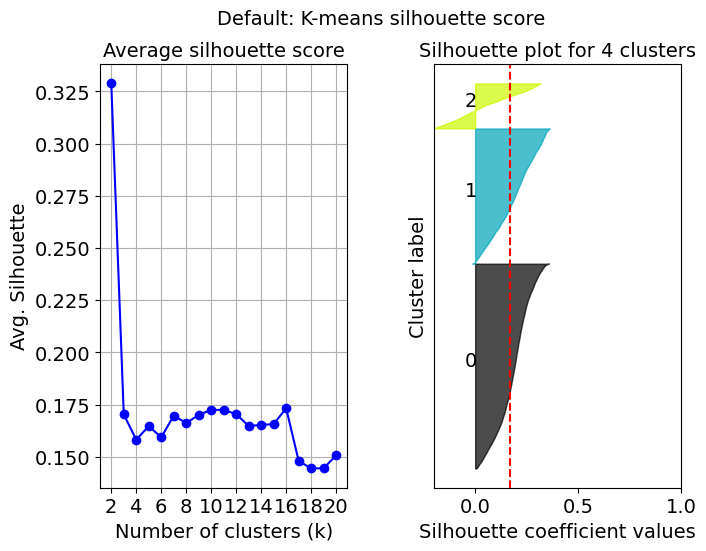

In [154]:
#inertias, silhouette_avg_scores = kmeans_tuning(X_train, 20, seed)
max_clusters = 20
range_n_clusters = list(range(2, max_clusters+1))

fontsize = 14
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(7.5, 5.5))
ax0.plot(range_n_clusters, silhouette_avg_scores,'-o', color='b')
ax0.tick_params(labelsize=fontsize)
ax0.set_title('Average silhouette score', fontsize=fontsize)
ax0.set_xlabel('Number of clusters (k)', fontsize=fontsize) 
ax0.set_ylabel('Avg. Silhouette', fontsize=fontsize)
ax0.set_xticks(range(2,22,2))
#plt.rcParams['axes.titley'] = 1.0
ax0.grid(True)


range_n_clusters = list(range(3, 7))
range_n_clusters = [3]
for n_clusters in range_n_clusters:
    
    print(f'K={n_clusters}')
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=seed, max_iter=1000, n_init=10)
    cluster_labels = kmeans.fit_predict(X_train)
    
    silhouette_avg = silhouette_score(X_train, cluster_labels)
    #silhouette_avg_scores.append(silhouette_avg)
    print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_train, cluster_labels)

   # fig, ax1 = plt.subplots(1, 1)
    #fig.set_size_inches(9, 7)
    y_lower = 10
                                                  
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i), fontsize=fontsize)

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
        
    ax1.set_title("Silhouette plot for 4 clusters", fontsize=fontsize)
    ax1.set_xlabel("Silhouette coefficient values", fontsize=fontsize)
    ax1.set_ylabel("Cluster label", fontsize=fontsize)
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    #ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    ax1.set_xlim((-0.2, 1))
    ax1.tick_params(labelsize=fontsize)
    fig.subplots_adjust(wspace=0.35)
    fig.suptitle('Default: K-means silhouette score', fontsize=fontsize) 
    fig.savefig('Default_kmeans_silhouette.png')
    plt.show()
    plt.close(fig)

K=2
For n_clusters = 2 The average silhouette_score is : 0.3287398561387057


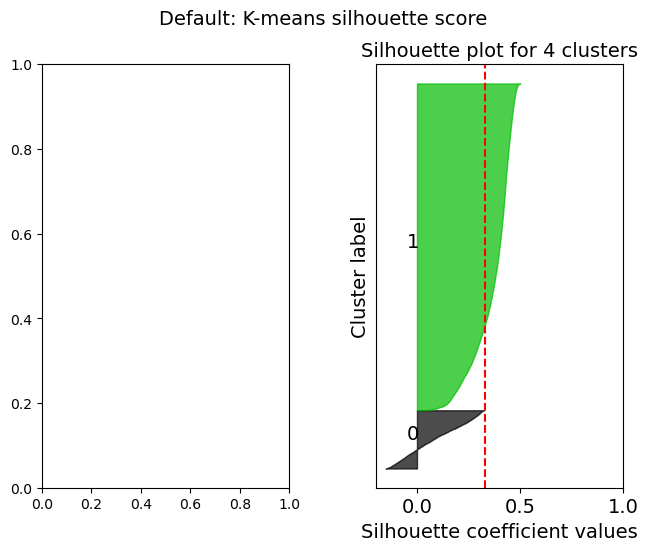

K=3
For n_clusters = 3 The average silhouette_score is : 0.17034691211594616


In [156]:
#inertias, silhouette_avg_scores = kmeans_tuning(X_train, 20, seed)
max_clusters = 20
range_n_clusters = list(range(2, max_clusters+1))

fontsize = 14
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(7.5, 5.5))
#ax0.plot(range_n_clusters, silhouette_avg_scores,'-o', color='b')
#ax0.tick_params(labelsize=fontsize)
#ax0.set_title('Average silhouette score', fontsize=fontsize)
#ax0.set_xlabel('Number of clusters (k)', fontsize=fontsize) 
#ax0.set_ylabel('Avg. Silhouette', fontsize=fontsize)
#ax0.set_xticks(range(2,22,2))
##plt.rcParams['axes.titley'] = 1.0
#ax0.grid(True)
#

range_n_clusters = list(range(2, 4))
#range_n_clusters = [3]
for n_clusters in range_n_clusters:
    
    print(f'K={n_clusters}')
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=seed, max_iter=1000, n_init=10)
    cluster_labels = kmeans.fit_predict(X_train)
    
    silhouette_avg = silhouette_score(X_train, cluster_labels)
    #silhouette_avg_scores.append(silhouette_avg)
    print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_train, cluster_labels)

   # fig, ax1 = plt.subplots(1, 1)
    #fig.set_size_inches(9, 7)
    y_lower = 10
                                                  
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i), fontsize=fontsize)

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
        
    ax1.set_title("Silhouette plot for 4 clusters", fontsize=fontsize)
    ax1.set_xlabel("Silhouette coefficient values", fontsize=fontsize)
    ax1.set_ylabel("Cluster label", fontsize=fontsize)
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    #ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    ax1.set_xlim((-0.2, 1))
    ax1.tick_params(labelsize=fontsize)
    fig.subplots_adjust(wspace=0.35)
    fig.suptitle('Default: K-means silhouette score', fontsize=fontsize) 
    fig.savefig('Default_kmeans_silhouette.png')
    plt.show()
    plt.close(fig)

Train time 0.28487309999763966
__________________________________________________________________________________
algo		inertia		homo	compl	v-meas	ARI	AMI	silhouette
K=3      	382865.789	0.013	0.007	0.009	-0.015	0.009	0.170


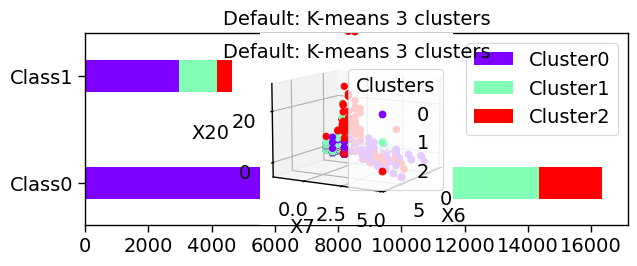

In [335]:
# Kmeans training with K=3

X_train = X_train_orig
X_test = X_test_orig

# Predict clusters
method='K-means'
n_clusters=3
tic = time.perf_counter()
kmeans = KMeans(n_clusters=n_clusters, random_state=seed, max_iter=1000, n_init=10).fit(X_train)
toc = time.perf_counter()
print('Train time', toc-tic)
cluster_labels = kmeans.predict(X_train)
#
# --------------------------------------------------------------------------------
results=[f'K={n_clusters}', kmeans.inertia_]
# Define the metrics which require only the true labels and estimator labels
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]
results += [m(y_train, cluster_labels) for m in clustering_metrics]

# The silhouette score requires the full dataset
results += [metrics.silhouette_score(X_train, cluster_labels)]
# Show the results
formatter_result = (
    "{:9s}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
)
print(82 * "_")
print("algo\t\tinertia\t\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")
print(formatter_result.format(*results))
# --------------------------------------------------------------------------------
#
# Plot clusters
fontsize = 14

elev=10
azim=30

fig = plt.figure(1, figsize=(11.5, 11.5))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)

plot3d_features = ["X6", "X7", "X20"]
col_X = [list(X_df.columns).index(x) for x in plot3d_features]
(X0, X1, X2) = (X_train[:, col_X[0]], X_train[:, col_X[1]], X_train[:, col_X[2]])
scatter = ax.scatter(X0, X1, X2, c=cluster_labels, cmap='rainbow', alpha=1)

ax.set_xlabel(plot3d_features[0], fontsize=fontsize)
ax.set_ylabel(plot3d_features[1], fontsize=fontsize,loc = "bottom")
ax.set_zlabel(plot3d_features[2], fontsize=fontsize)
ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(cluster_labels)], loc='center right', title="Clusters", fontsize=fontsize,title_fontsize=fontsize)
plt.rcParams['axes.titley'] = 0.90
ax.set_ylim((-2, 5))
ax.set_zlim((-5, 30))
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()
fig.savefig(f'{data_name}_{method}_{n_clusters}clusters.png')
#

# Bar plot counts
true_classes = list(set(y_train))
df_counts = pd.DataFrame(index=[f'Class{c}' for c in true_classes])
for cluster in set(cluster_labels): 
    unique_values, counts = np.unique(y_train[cluster_labels==cluster], return_counts=True)
    temp = [0]*len(true_classes)
    for i in range(len(unique_values)):
        temp[true_classes.index(unique_values[i])] = counts[i]    
    df_counts[f'Cluster{cluster}'] = temp
ax = df_counts.plot.barh(stacked=True, width=0.6, cmap='rainbow',figsize=(7, 2.5))
plt.rcParams['axes.titley'] = 1.0
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.legend(fontsize=fontsize)
plt.savefig(f'{data_name}_{method}_{n_clusters}clusters_barplot.png')
#

# Predict test set
pred_test_labels = kmeans.predict(X_test)

np.savetxt(f"{data_name}_{method}_{n_clusters}k_train_labels_{case}.csv", cluster_labels)
np.savetxt(f"{data_name}_{method}_{n_clusters}k_test_labels_{case}.csv" , pred_test_labels)


__________________________________________________________________________________
algo		inertia		homo	compl	v-meas	ARI	AMI	silhouette
K=3      	382865.789	0.013	0.007	0.009	-0.015	0.009	0.170


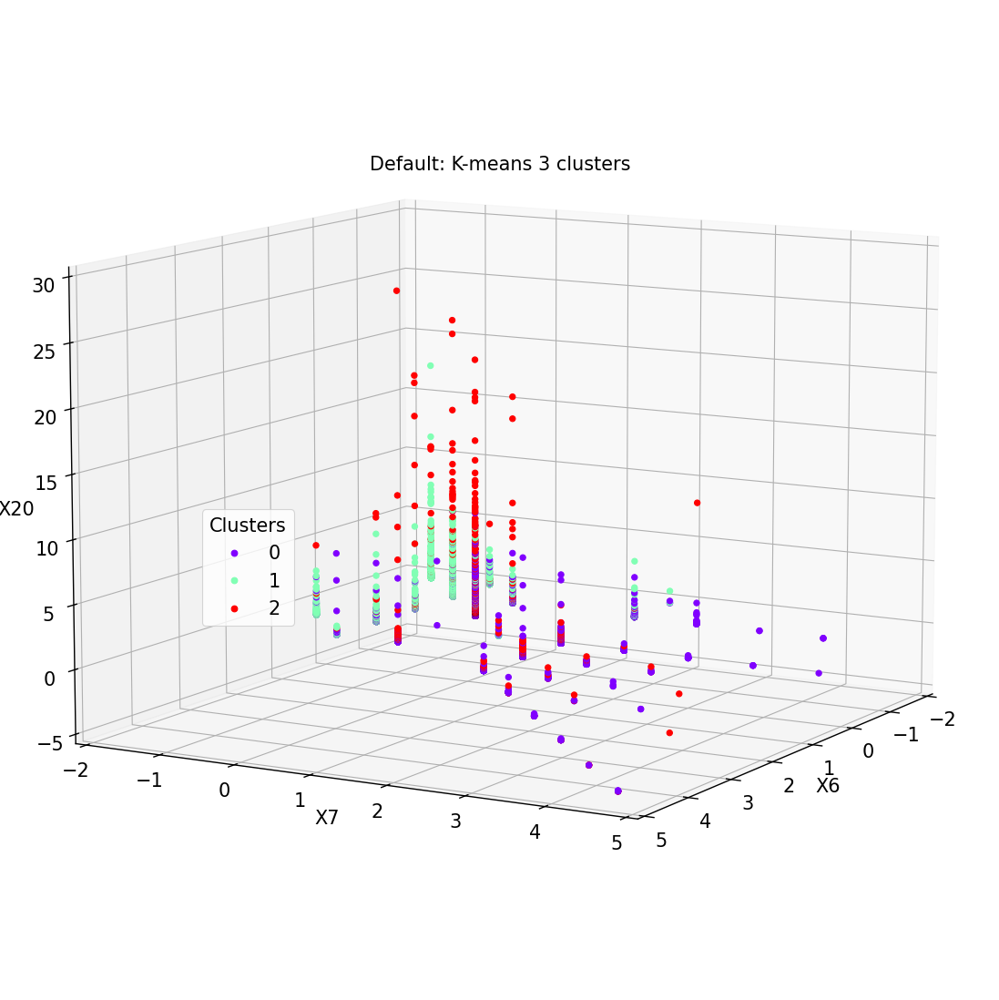

In [355]:
# Kmeans training with K=3

X_train = X_train_orig
X_test = X_test_orig

# Predict clusters
method='K-means'
n_clusters=3
kmeans = KMeans(n_clusters=n_clusters, random_state=seed, max_iter=1000, n_init=10)
cluster_labels = kmeans.fit_predict(X_train)
#
# --------------------------------------------------------------------------------
results=[f'K={n_clusters}', kmeans.inertia_]
# Define the metrics which require only the true labels and estimator labels
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]
results += [m(y_train, cluster_labels) for m in clustering_metrics]

# The silhouette score requires the full dataset
results += [metrics.silhouette_score(X_train, cluster_labels)]
# Show the results
formatter_result = (
    "{:9s}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
)
print(82 * "_")
print("algo\t\tinertia\t\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")
print(formatter_result.format(*results))
# --------------------------------------------------------------------------------
#
# Plot clusters
fontsize = 15

elev=10
azim=30

fig = plt.figure(1, figsize=(14, 14))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)

plot3d_features = ["X6", "X7", "X20"]
col_X = [list(X_df.columns).index(x) for x in plot3d_features]
(X0, X1, X2) = (X_train[:, col_X[0]], X_train[:, col_X[1]], X_train[:, col_X[2]])
scatter = ax.scatter(X0, X1, X2, c=cluster_labels, cmap='rainbow', alpha=1)

ax.set_xlabel(plot3d_features[0], fontsize=fontsize)
ax.set_ylabel(plot3d_features[1], fontsize=fontsize,loc = "bottom")
ax.set_zlabel(plot3d_features[2], fontsize=fontsize)
ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(cluster_labels)], bbox_to_anchor=(0.3,0.5), title="Clusters", fontsize=fontsize,title_fontsize=fontsize)
plt.rcParams['axes.titley'] = 0.90
ax.set_xlim((-2, 5))
ax.set_ylim((-2, 5))
ax.set_zlim((-5, 30))
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()
fig.savefig(f'{data_name}_{method}_{n_clusters}clusters.png')
#


# Predict test set
pred_test_labels = kmeans.predict(X_test)

np.savetxt(f"{data_name}_{method}_{n_clusters}k_train_labels_{case}.csv", cluster_labels)
np.savetxt(f"{data_name}_{method}_{n_clusters}k_test_labels_{case}.csv" , pred_test_labels)


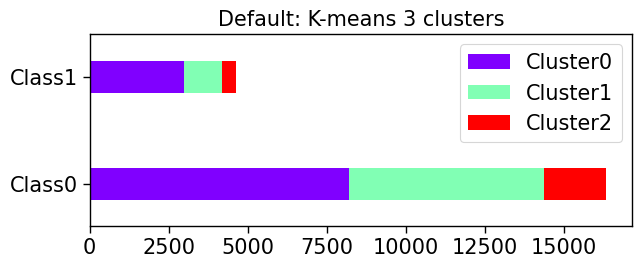

In [356]:
# Bar plot counts
true_classes = list(set(y_train))
df_counts = pd.DataFrame(index=[f'Class{c}' for c in true_classes])
for cluster in set(cluster_labels): 
    unique_values, counts = np.unique(y_train[cluster_labels==cluster], return_counts=True)
    temp = [0]*len(true_classes)
    for i in range(len(unique_values)):
        temp[true_classes.index(unique_values[i])] = counts[i]    
    df_counts[f'Cluster{cluster}'] = temp
ax = df_counts.plot.barh(stacked=True, width=0.3, cmap='rainbow',figsize=(7, 2.5))
plt.rcParams['axes.titley'] = 1.0
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.legend(fontsize=fontsize)
plt.savefig(f'{data_name}_{method}_{n_clusters}clusters_barplot.png')
plt.show()
#

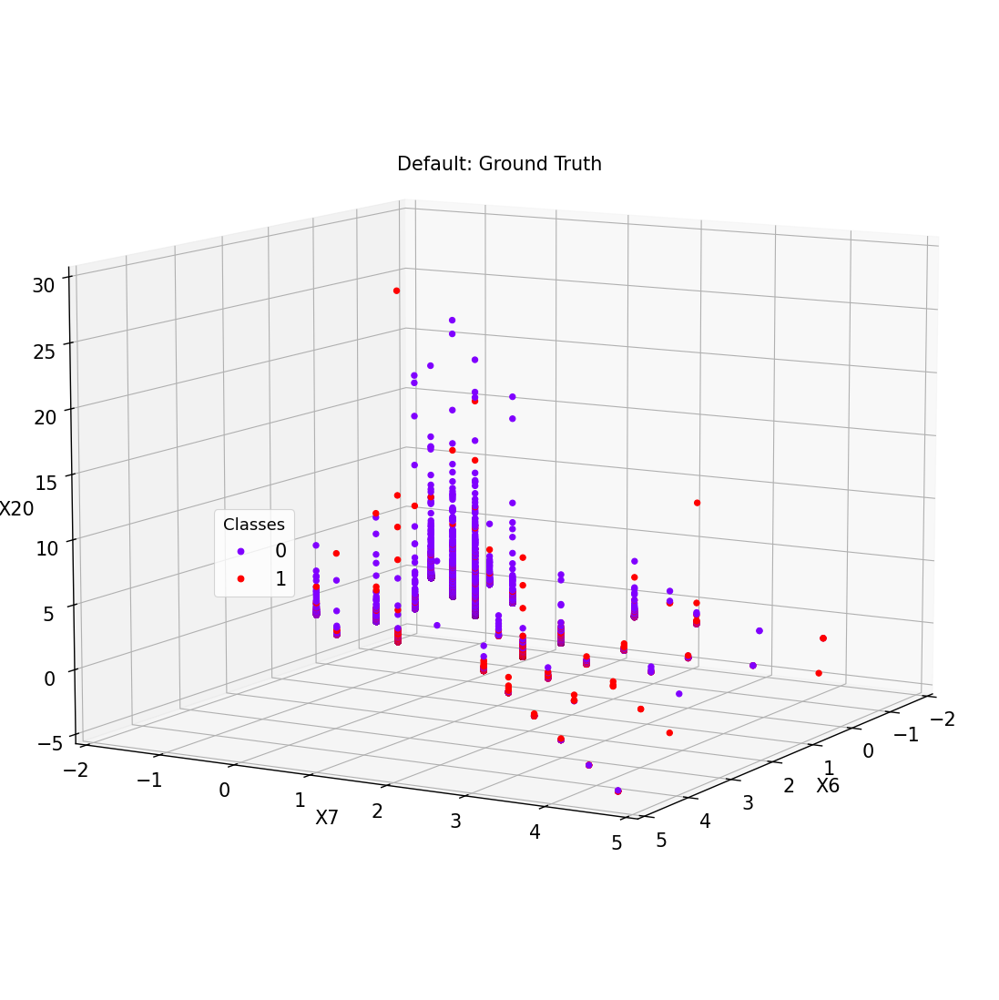

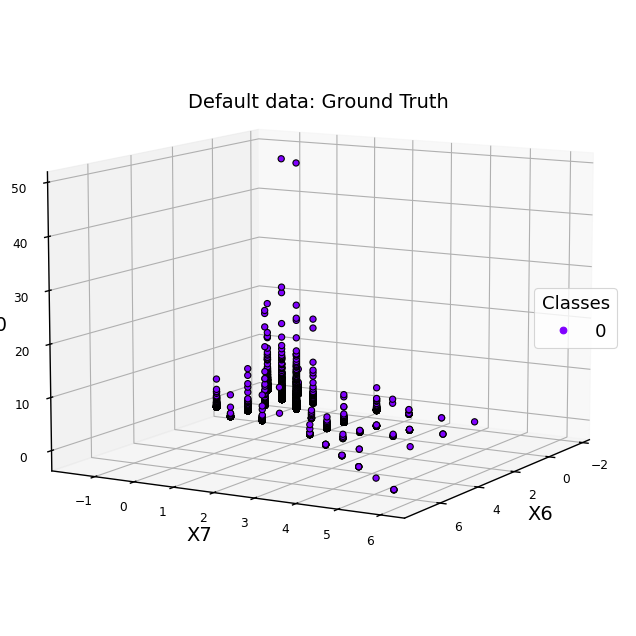

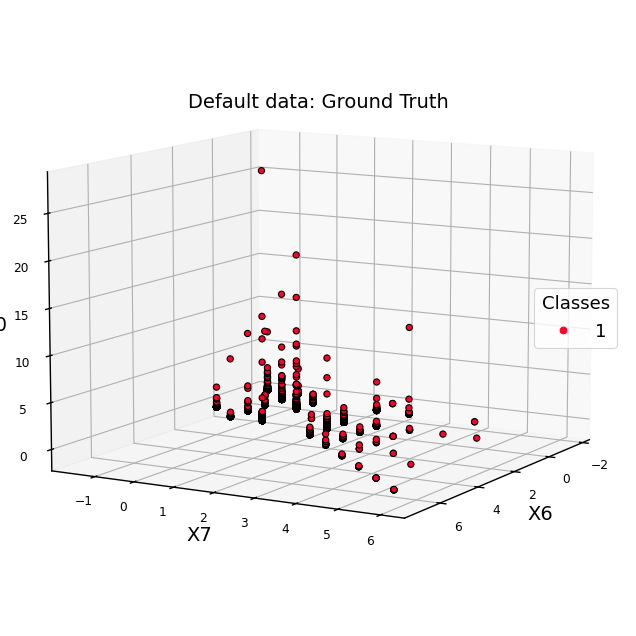

In [351]:
X_train = X_train_orig
labels = y_train
method = 'Ground Truth'
elev=10
azim=30

fig = plt.figure(1, figsize=(14, 14))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)

plot3d_features = ["X6", "X7", "X20"]
col_X = [list(X_df.columns).index(x) for x in plot3d_features]
(X0, X1, X2) = (X_train[:, col_X[0]], X_train[:, col_X[1]], X_train[:, col_X[2]])
scatter = ax.scatter(X0, X1, X2, c=labels, cmap='rainbow', alpha=1)

fontsize=15
ax.set_xlabel(plot3d_features[0], fontsize=fontsize) 
ax.set_ylabel(plot3d_features[1], fontsize=fontsize) 
ax.set_zlabel(plot3d_features[2], fontsize=fontsize) 
ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(labels)], bbox_to_anchor=(0.3,0.5), title="Classes",fontsize=fontsize)
plt.rcParams['axes.titley'] = 0.90
ax.set_xlim((-2, 5))
ax.set_ylim((-2, 5))
ax.set_zlim((-5, 30))
ax.set_title(f"{data_name}: {method}", fontsize=fontsize)
#plt.subplots_adjust(wspace=0.25, hspace=0.25)
ax.tick_params(labelsize=fontsize)
#ax.legend(fontsize=fontsize)
plt.show()
plt.close(fig)
fig.savefig('Default_ground_truth.png')


fig = plt.figure(1, figsize=(8, 8))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)
scatter = ax.scatter(X0[labels==0], X1[labels==0], X2[labels==0], c=labels[labels==0], cmap='rainbow', edgecolor="k", alpha=1)
ax.set_xlabel(plot3d_features[0])
ax.set_ylabel(plot3d_features[1])
ax.set_zlabel(plot3d_features[2])
ax.legend(scatter.legend_elements()[0], ['0'], loc='center right', title="Classes")
plt.rcParams['axes.titley'] = 0.9
#ax.set_ylim((-0.9,-0.6))
ax.set_title(f"Default data: Ground Truth")
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()

fig = plt.figure(1, figsize=(8, 8))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)
scatter = ax.scatter(X0[labels==1], X1[labels==1], X2[labels==1], c=labels[labels==1], cmap='gist_rainbow', edgecolor="k", alpha=1)
ax.set_xlabel(plot3d_features[0])
ax.set_ylabel(plot3d_features[1])
ax.set_zlabel(plot3d_features[2])
ax.legend(scatter.legend_elements()[0], ['1'], loc='center right', title="Classes")
plt.rcParams['axes.titley'] = 0.9
#ax.set_ylim((-0.9,-0.6))
ax.set_title(f"Default data: Ground Truth")
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()


In [32]:
X_train[:,4][y_train==0]

array([ 0.01429362, -0.87799434,  0.01429362, ...,  0.90658159,
       -0.87799434,  0.01429362])

In [166]:
X_train = X_train_orig

## GMM

def gmm_bic_score(estimator, X):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(X)


param_grid = {
    "n_components": range(1, 11),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}
grid_search = GridSearchCV(
    GaussianMixture(max_iter=1000, tol=1e-4, n_init=10, random_state=seed), param_grid=param_grid, scoring=gmm_bic_score, n_jobs=8
)
grid_search.fit(X_train)

df = pd.DataFrame(grid_search.cv_results_)[
    ["param_n_components", "param_covariance_type", "mean_test_score"]
]
df["mean_test_score"] = -df["mean_test_score"]
df = df.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "BIC score",
    }
)
df.sort_values(by="BIC score").head()


,Number of components,Type of covariance,BIC score
39,10,full,-134788.264229
37,8,full,-117413.026236
38,9,full,-115965.357640
36,7,full,-109512.553180
35,6,full,-65530.232940


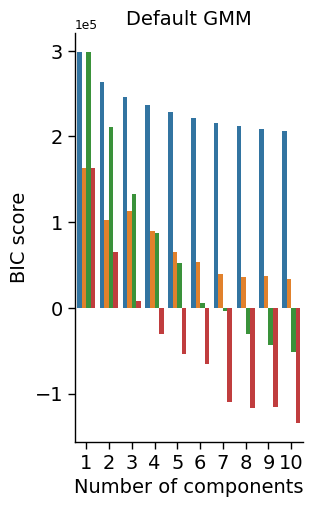

In [175]:
sns.reset_defaults()
sns.set_context("paper", rc={"font.size":14,"axes.titlesize":14,"axes.labelsize":14, 'legend.fontsize': 13, 'legend.title_fontsize': 13})
ax=sns.catplot(
    data=df,
    kind="bar",
    x="Number of components",
    y="BIC score",
    hue="Type of covariance",
    height=5, aspect=.8
)
ax._legend.remove()
#sns.move_legend(ax, "upper right", bbox_to_anchor=(.70, 0.9))
plt.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
plt.title('Default GMM')
plt.tick_params(labelsize=fontsize) 
plt.xticks(fontsize=14)
plt.show()
ax.savefig('Default_bic.png')


Train time 51.49104720004834
__________________________________________________________________________________
algo		components	homo	compl	v-meas	ARI	AMI	silhouette
gmm      	n_comp=7 	0.062	0.018	0.028	0.028	0.028	0.022


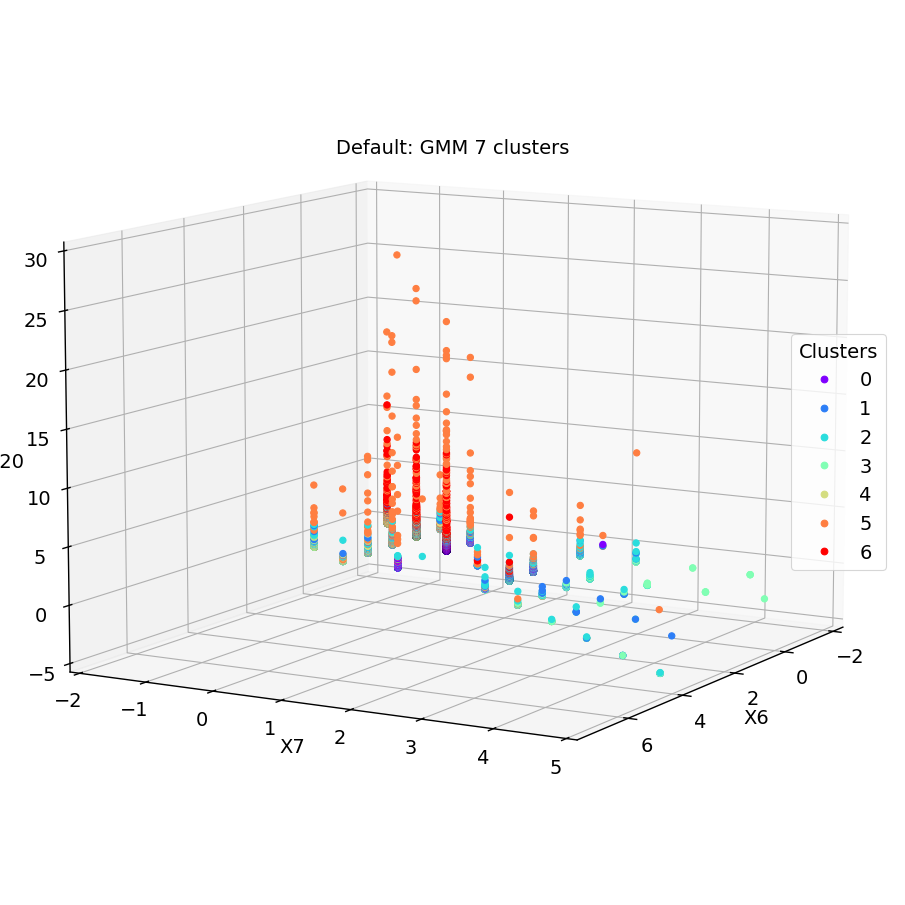

In [317]:
X_train = X_train_orig
X_test = X_test_orig

method='GMM'
n_clusters = 7
covariance_type='full'

tic = time.perf_counter()
gm = GaussianMixture(n_components=n_clusters, covariance_type=covariance_type, max_iter=1000, tol=1e-4, n_init=10, random_state=seed).fit(X_train)
toc = time.perf_counter()
print('Train time', toc-tic)
gm_labels = gm.predict(X_train)

cluster_labels = gm_labels

results=['gmm', f'n_comp={n_clusters}']
# Define the metrics which require only the true labels and estimator labels
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]
results += [m(y_train, cluster_labels) for m in clustering_metrics]

# The silhouette score requires the full dataset
results += [metrics.silhouette_score(X_train, cluster_labels)]
# Show the results
formatter_result = (
    "{:9s}\t{:9s}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
)
print(82 * "_")
print("algo\t\tcomponents\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")
print(formatter_result.format(*results))

# Plot clusters
fontsize = 14

elev=10
azim=30

fig = plt.figure(1, figsize=(11.5, 11.5))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)

plot3d_features = ["X6", "X7", "X20"]
col_X = [list(X_df.columns).index(x) for x in plot3d_features]
(X0, X1, X2) = (X_train[:, col_X[0]], X_train[:, col_X[1]], X_train[:, col_X[2]])
scatter = ax.scatter(X0, X1, X2, c=cluster_labels, cmap='rainbow', alpha=1)

ax.set_xlabel(plot3d_features[0], fontsize=fontsize)
ax.set_ylabel(plot3d_features[1], fontsize=fontsize,loc = "bottom")
ax.set_zlabel(plot3d_features[2], fontsize=fontsize)
ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(cluster_labels)], loc='center right', title="Clusters", fontsize=fontsize,title_fontsize=fontsize)
plt.rcParams['axes.titley'] = 0.90
ax.set_ylim((-2, 5))
ax.set_zlim((-5, 30))
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()
fig.savefig(f'{data_name}_{method}_{n_clusters}clusters.png')
#

# Predict test set
pred_test_labels = gm.predict(X_test)

np.savetxt(f"{data_name}_{method}_{n_clusters}k_train_labels_{case}.csv", gm.predict_proba(X_train))
np.savetxt(f"{data_name}_{method}_{n_clusters}k_test_labels_{case}.csv" , gm.predict_proba(X_test))

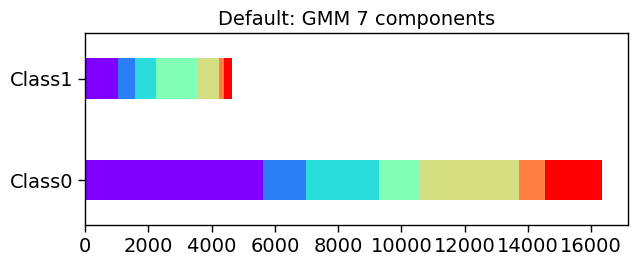

In [198]:
# Bar plot counts
true_classes = list(set(y_train))
df_counts = pd.DataFrame(index=[f'Class{c}' for c in true_classes])
for cluster in set(cluster_labels): 
    unique_values, counts = np.unique(y_train[cluster_labels==cluster], return_counts=True)
    temp = [0]*len(true_classes)
    for i in range(len(unique_values)):
        temp[true_classes.index(unique_values[i])] = counts[i]    
    df_counts[f'Cluster{cluster}'] = temp
ax = df_counts.plot.barh(stacked=True, width=0.4, cmap='rainbow',figsize=(7, 2.5), legend=False)
plt.rcParams['axes.titley'] = 1.0
ax.set_title(f"{data_name}: {method} {n_clusters} components", fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
#ax.legend(fontsize=fontsize)
plt.savefig(f'{data_name}_{method}_{n_clusters}clusters_barplot.png')
plt.show()

__________________________________________________________________________________
algo		components	homo	compl	v-meas	ARI	AMI	silhouette
gmm      	n_comp=2 	0.015	0.013	0.014	-0.030	0.014	0.101


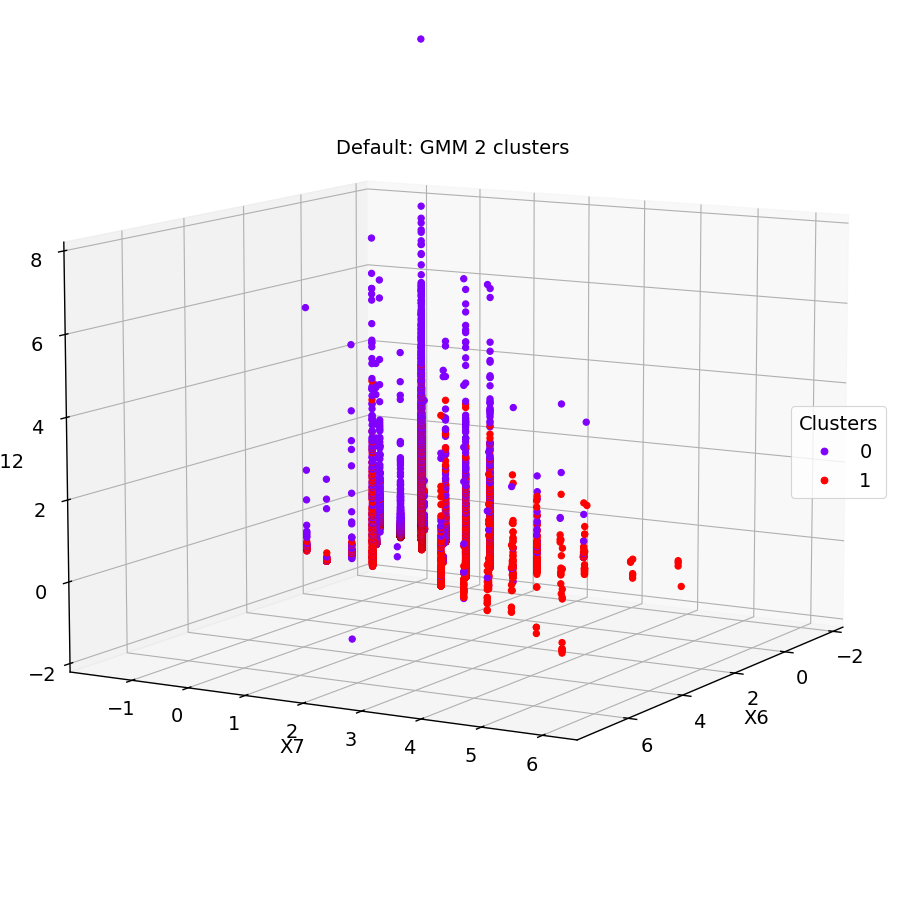

In [195]:
X_train = X_train_orig
X_test = X_test_orig

method='GMM'
n_components = 2
covariance_type='full'

gm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, max_iter=1000, tol=1e-4, n_init=10, random_state=seed).fit(X_train)
gm_labels = gm.predict(X_train)

cluster_labels = gm_labels

results=['gmm', f'n_comp={n_components}']
# Define the metrics which require only the true labels and estimator labels
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]
results += [m(y_train, cluster_labels) for m in clustering_metrics]

# The silhouette score requires the full dataset
results += [metrics.silhouette_score(X_train, cluster_labels)]
# Show the results
formatter_result = (
    "{:9s}\t{:9s}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
)
print(82 * "_")
print("algo\t\tcomponents\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")
print(formatter_result.format(*results))

# Plot clusters
fontsize = 14

elev=10
azim=30

fig = plt.figure(1, figsize=(11.5, 11.5))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)

plot3d_features = ["X6", "X7", "X12"]
col_X = [list(X_df.columns).index(x) for x in plot3d_features]
(X0, X1, X2) = (X_train[:, col_X[0]], X_train[:, col_X[1]], X_train[:, col_X[2]])
scatter = ax.scatter(X0, X1, X2, c=cluster_labels, cmap='rainbow', alpha=1)

ax.set_xlabel(plot3d_features[0], fontsize=fontsize)
ax.set_ylabel(plot3d_features[1], fontsize=fontsize,loc = "bottom")
ax.set_zlabel(plot3d_features[2], fontsize=fontsize)
ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(cluster_labels)], loc='center right', title="Clusters", fontsize=fontsize,title_fontsize=fontsize)
plt.rcParams['axes.titley'] = 0.90
#ax.set_ylim((-2, 5))
ax.set_zlim((-2, 8))
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()
fig.savefig(f'{data_name}_{method}_{n_clusters}clusters.png')
#

# Predict test set
pred_test_labels = gm.predict(X_test)

np.savetxt(f"{data_name}_{method}_{n_clusters}k_train_labels_{case}.csv", gm.predict_proba(X_train))
np.savetxt(f"{data_name}_{method}_{n_clusters}k_test_labels_{case}.csv" , gm.predict_proba(X_test))

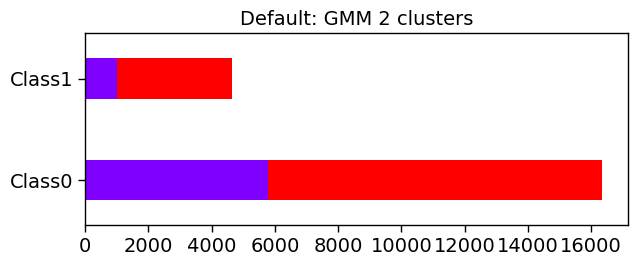

In [191]:
# Bar plot counts
true_classes = list(set(y_train))
df_counts = pd.DataFrame(index=[f'Class{c}' for c in true_classes])
for cluster in set(cluster_labels): 
    unique_values, counts = np.unique(y_train[cluster_labels==cluster], return_counts=True)
    temp = [0]*len(true_classes)
    for i in range(len(unique_values)):
        temp[true_classes.index(unique_values[i])] = counts[i]    
    df_counts[f'Cluster{cluster}'] = temp
ax = df_counts.plot.barh(stacked=True, width=0.4, cmap='rainbow',figsize=(7, 2.5), legend=False)
plt.rcParams['axes.titley'] = 1.0
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
#ax.legend(fontsize=fontsize)
plt.savefig(f'{data_name}_{method}_{n_clusters}clusters_barplot.png')
plt.show()

### Dimensionality Reduction

#### 1) PCA

In [199]:
# PCA
X_train = X_train_orig
pca_components = X_train.shape[1]
pca = PCA(n_components=pca_components, random_state=seed)
pca.fit(X_train)
    
explained_variance_ratio = pca.explained_variance_ratio_
cum_explained_variance_ratio = explained_variance_ratio.cumsum()

C:\Users\akoutras\AppData\Local\Temp\ipykernel_20004\925507642.py:15: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "--r" (-> color='r'). The keyword argument will take precedence.
  ax.plot([0, 26], [0.95, 0.95],'--r',linewidth=2,color='red')


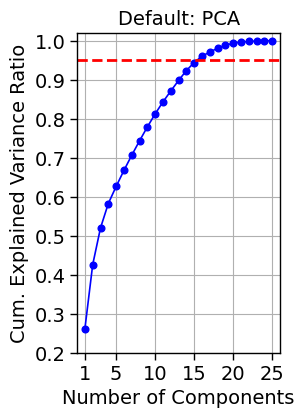

In [239]:
# PCA
X_train = X_train_orig
pca_components = X_train.shape[1]
pca = PCA(n_components=pca_components, random_state=seed)
pca.fit(X_train)
    
explained_variance_ratio = pca.explained_variance_ratio_
cum_explained_variance_ratio = explained_variance_ratio.cumsum()

fontsize = 14
fig = plt.figure(figsize=(2.9,4))

ax = fig.add_axes([0.24, 0.14, 0.7, 0.80])
ax.plot(range(1, pca_components+1), cum_explained_variance_ratio,'-o', color='blue')
ax.plot([0, 26], [0.95, 0.95],'--r',linewidth=2,color='red')
ax.tick_params(labelsize=fontsize)
ax.set_title('Default: PCA', fontsize=fontsize)
ax.set_xlabel('Number of Components', fontsize=fontsize) 
ax.set_ylabel('Cum. Explained Variance Ratio', fontsize=fontsize)
ax.set_xticks([1]+list(range(5,30,5)))
ax.set_yticks(np.arange(0.2,1.1,0.1))
ax.set_xlim((0,26))
ax.set_ylim((0.2,1.02))
plt.rcParams['axes.titley'] = 1.
plt.grid(True)
plt.show()
fig.savefig('Default_PCA_explained_variance.png')
plt.close(fig)

In [101]:
# Determine the number of components to use using the explained variance criterion
explained_variance = np.var(pca.transform(X_train), axis=0)
explained_variance_ratio = explained_variance / np.sum(explained_variance)
n_components = np.argmax(np.cumsum(explained_variance_ratio) >= 0.95) + 1

print(explained_variance_ratio)
print(n_components)
np.cumsum(explained_variance_ratio)

[2.61889490e-01 1.64294028e-01 9.40801683e-02 6.25710506e-02
 4.36470612e-02 4.11779289e-02 3.88056713e-02 3.70759709e-02
 3.55402929e-02 3.34289580e-02 3.07029895e-02 2.79500693e-02
 2.69773436e-02 2.54909747e-02 2.04853737e-02 1.64054235e-02
 1.04311001e-02 9.92603668e-03 7.54329628e-03 5.23967750e-03
 2.84550739e-03 1.59154838e-03 1.01200325e-03 8.88036610e-04
 4.23789359e-33]
16


array([0.26188949, 0.42618352, 0.52026369, 0.58283474, 0.6264818 ,
       0.66765973, 0.7064654 , 0.74354137, 0.77908166, 0.81251062,
       0.84321361, 0.87116368, 0.89814102, 0.923632  , 0.94411737,
       0.96052279, 0.97095389, 0.98087993, 0.98842323, 0.9936629 ,
       0.99650841, 0.99809996, 0.99911196, 1.        , 1.        ])

In [265]:
X_train = X_train_orig

# SELECT COMPONENTS
pca_components = 16
pca = PCA(n_components=pca_components, random_state=seed)
tic = time.perf_counter()
pca.fit(X_train)
toc = time.perf_counter()
print('Time to train', toc-tic)
X_train_pca = pca.transform(X_train)

X_train_rec = X_train_pca @ (pca.components_)
norm_error = np.linalg.norm(X_train - X_train_rec)/np.linalg.norm(X_train)
print('Normalized reconstruction error', norm_error)


Time to train 0.10010579996742308
Normalized reconstruction error 0.19868871693833368


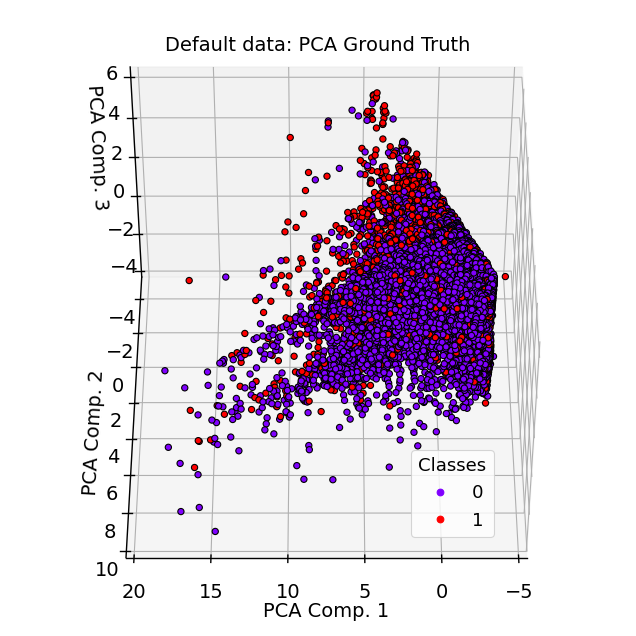

In [333]:
fig = plt.figure(1, figsize=(8, 8))

ax = fig.add_subplot(111,projection="3d", elev=45, azim=90)

scatter = ax.scatter(X_train_pca[:, 0], X_train_pca[:, 1], X_train_pca[:, 2], c=y_train, cmap='rainbow', edgecolor="k", alpha=1)

ax.legend(scatter.legend_elements()[0], ['0','1'], bbox_to_anchor=(0.8,0.3), title="Classes")
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')
plt.rcParams['axes.titley'] = 1.0

ax.set_xlim((-5, 20))
ax.set_ylim((-5, 10))
ax.set_xlabel("PCA Comp. 1")
ax.set_ylabel("PCA Comp. 2")
ax.set_zlabel("PCA Comp. 3")
ax.set_title("Default data: PCA Ground Truth")
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()
fig.savefig('Default_PCA_ground_truth.png')

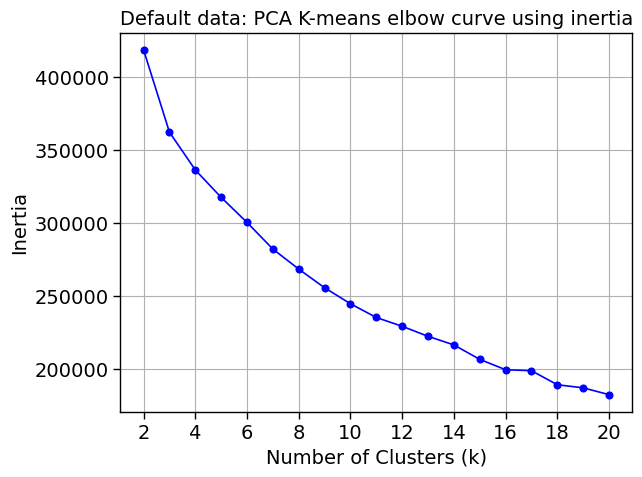

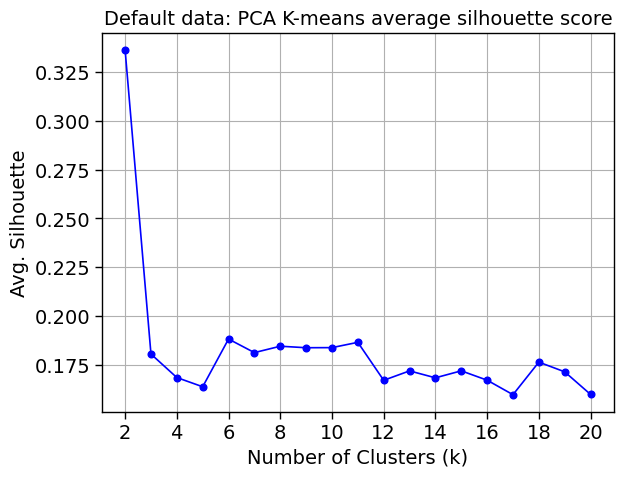

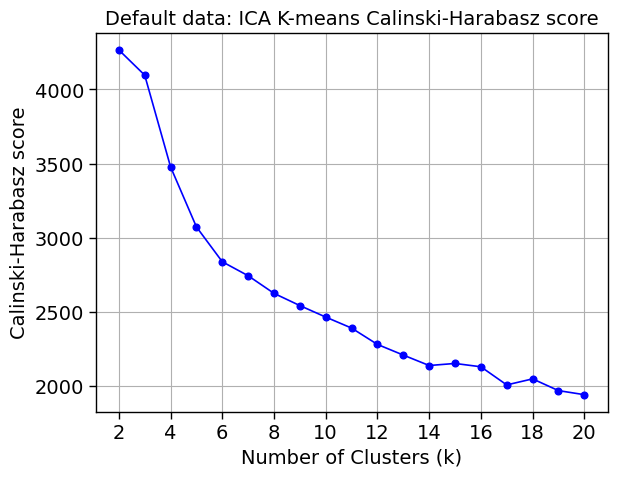

In [258]:
max_clusters = 20
inertias, silhouette_avg_scores, ch_scores = kmeans_tuning(X_train_pca, max_clusters, seed)
range_n_clusters = list(range(2, max_clusters+1))

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range_n_clusters, inertias,'-o', color='b')

ax.tick_params(labelsize=fontsize)
ax.set_title('Default data: PCA K-means elbow curve using inertia', fontsize=fontsize)
ax.set_xlabel('Number of Clusters (k)', fontsize=fontsize) 
ax.set_ylabel('Inertia', fontsize=fontsize)
ax.set_xticks(range(2,22,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range_n_clusters, silhouette_avg_scores,'-o', color='b')

ax.tick_params(labelsize=fontsize)
ax.set_title('Default data: PCA K-means average silhouette score', fontsize=fontsize)
ax.set_xlabel('Number of Clusters (k)', fontsize=fontsize) 
ax.set_ylabel('Avg. Silhouette', fontsize=fontsize)
ax.set_xticks(range(2,22,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range_n_clusters, ch_scores,'-o', color='b')

ax.tick_params(labelsize=fontsize)
ax.set_title('Default data: ICA K-means Calinski-Harabasz score', fontsize=fontsize)
ax.set_xlabel('Number of Clusters (k)', fontsize=fontsize) 
ax.set_ylabel('Calinski-Harabasz score', fontsize=fontsize)
ax.set_xticks(range(2,22,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)


K=2
For n_clusters = 2 The average silhouette_score is : 0.3363917685022323


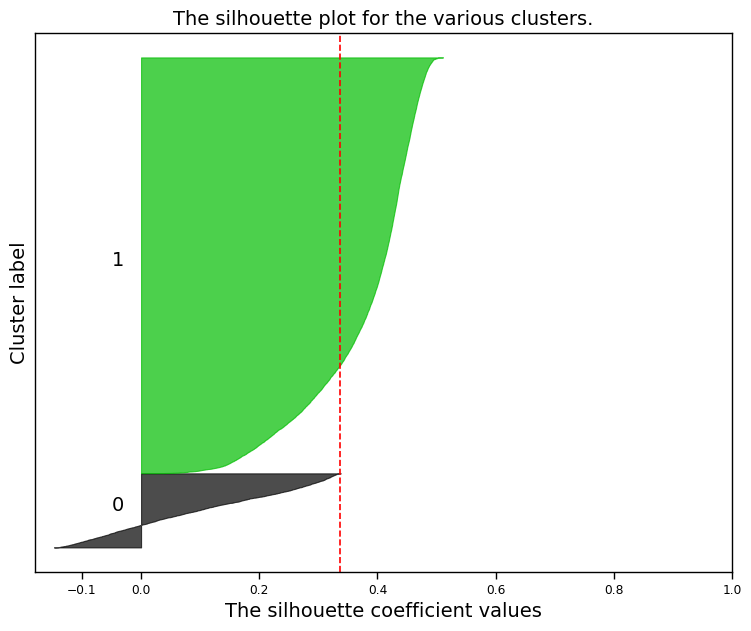

K=3
For n_clusters = 3 The average silhouette_score is : 0.18055260208203502


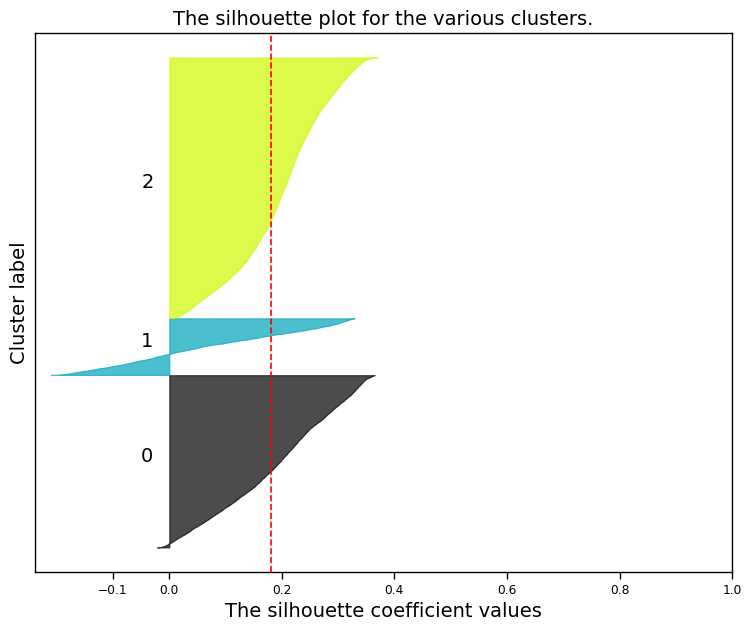

K=4
For n_clusters = 4 The average silhouette_score is : 0.16826852029801917


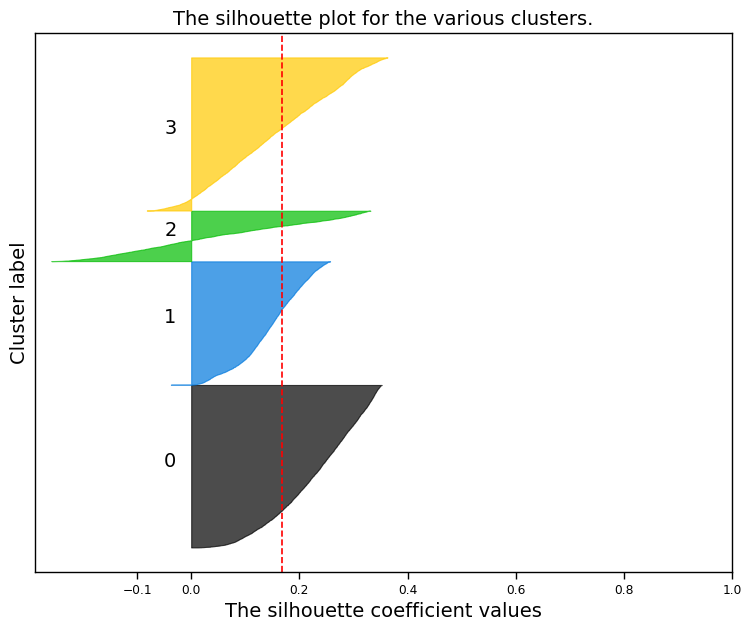

K=5
For n_clusters = 5 The average silhouette_score is : 0.16368482526456993


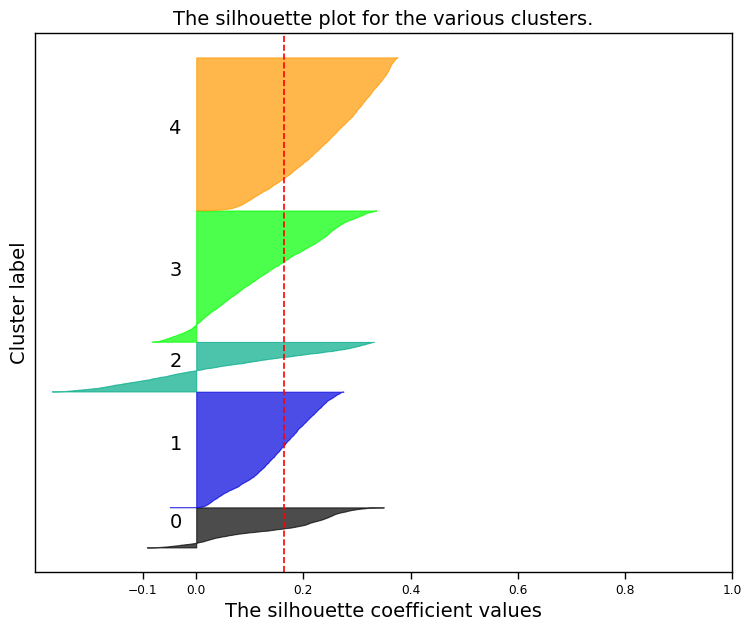

In [259]:
X = X_train_pca

range_n_clusters = list(range(2, 6))

for n_clusters in range_n_clusters:
    
    print(f'K={n_clusters}')
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=seed, max_iter=1000, n_init=10)
    cluster_labels = kmeans.fit_predict(X)
    
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_avg_scores.append(silhouette_avg)
    print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(9, 7)
    y_lower = 10
                                                  
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
        
    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.show()
    #fig.savefig('rhc_effect_max_attempts.png')
    plt.close(fig)

Train time 0.272463999921456
__________________________________________________________________________________
algo		inertia		homo	compl	v-meas	ARI	AMI	silhouette
K=3      	362190.323	0.013	0.007	0.009	-0.015	0.009	0.181


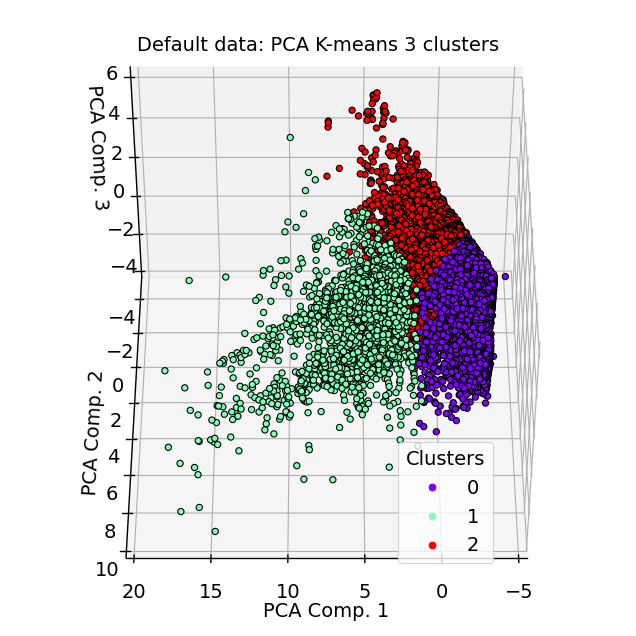

In [332]:
# Kmeans training with K=2
X = X_train_pca
n_clusters=3

tic = time.perf_counter()
kmeans = KMeans(n_clusters=n_clusters, random_state=seed, max_iter=1000, n_init=10).fit(X)
toc = time.perf_counter()
print('Train time', toc-tic)

cluster_labels = kmeans.predict(X)

results=[f'K={n_clusters}', kmeans.inertia_]
# Define the metrics which require only the true labels and estimator labels
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]
results += [m(y_train, cluster_labels) for m in clustering_metrics]

# The silhouette score requires the full dataset
results += [metrics.silhouette_score(X, cluster_labels)]
# Show the results
formatter_result = (
    "{:9s}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
)
print(82 * "_")
print("algo\t\tinertia\t\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")
print(formatter_result.format(*results))

fontsize=14
fig = plt.figure(1, figsize=(8, 8))
ax = fig.add_subplot(111,projection="3d", elev=45, azim=90)

scatter = ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=cluster_labels, cmap='rainbow', edgecolor="k", alpha=1)

ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(cluster_labels)], loc='center right', title="Clusters", 
          fontsize=fontsize,title_fontsize=fontsize,bbox_to_anchor=(0.8,0.20))
plt.rcParams['axes.titley'] = 1.0
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')

plt.rcParams['axes.titley'] = 1

ax.set_xlim((-5, 20))
ax.set_ylim((-5, 10))
ax.set_xlabel("PCA Comp. 1")
ax.set_ylabel("PCA Comp. 2")
ax.set_zlabel("PCA Comp. 3")
ax.set_title(f"Default data: PCA K-means {n_clusters} clusters")

plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()
fig.savefig('Default_PCA_Kmeans.png')

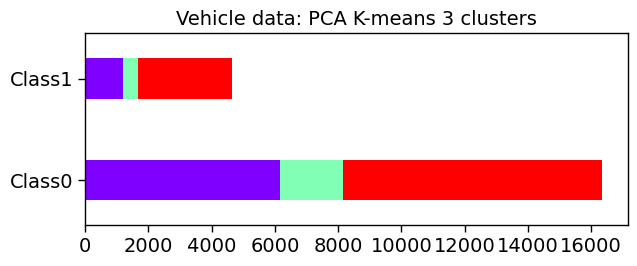

In [272]:
# Bar plot counts
true_classes = list(set(y_train))
df_counts = pd.DataFrame(index=[f'Class{c}' for c in true_classes])
for cluster in set(cluster_labels): 
    unique_values, counts = np.unique(y_train[cluster_labels==cluster], return_counts=True)
    temp = [0]*len(true_classes)
    for i in range(len(unique_values)):
        temp[true_classes.index(unique_values[i])] = counts[i]    
    df_counts[f'Cluster{cluster}'] = temp
ax = df_counts.plot.barh(stacked=True, width=0.4, cmap='rainbow',figsize=(7, 2.5), legend=False)
plt.rcParams['axes.titley'] = 1.0
ax.set_title(f"Vehicle data: PCA K-means {n_clusters} clusters")
ax.tick_params(labelsize=fontsize)
#ax.legend(fontsize=fontsize)
#plt.savefig(f'{data_name}_{method}_{n_clusters}clusters_barplot.png')
plt.show()

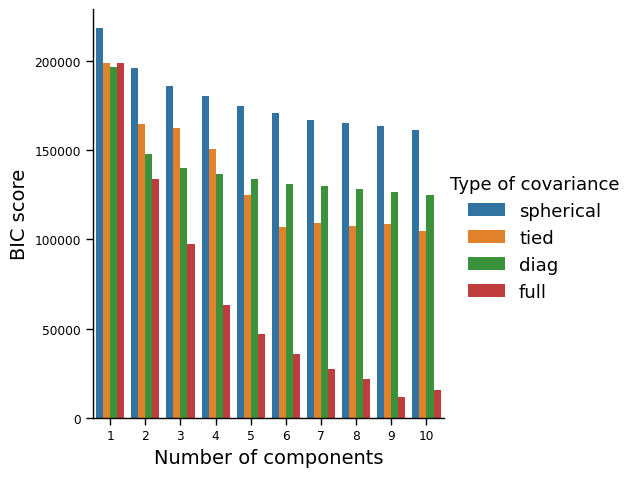

,Number of components,Type of covariance,BIC score
38,9,full,11720.962092
39,10,full,15442.135902
37,8,full,21622.445704
36,7,full,27504.811729
35,6,full,35912.949249


In [270]:
## GMM
X = X_train_pca

def gmm_bic_score(estimator, X):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(X)


param_grid = {
    "n_components": range(1, 11),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}
grid_search = GridSearchCV(
    GaussianMixture(max_iter=1000, tol=1e-4, n_init=10, random_state=seed), param_grid=param_grid, scoring=gmm_bic_score, n_jobs=8
)
grid_search.fit(X)

df = pd.DataFrame(grid_search.cv_results_)[
    ["param_n_components", "param_covariance_type", "mean_test_score"]
]
df["mean_test_score"] = -df["mean_test_score"]
df = df.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "BIC score",
    }
)

sns.catplot(
    data=df,
    kind="bar",
    x="Number of components",
    y="BIC score",
    hue="Type of covariance",
)
plt.show()

df.sort_values(by="BIC score").head()

Train time 45.226483799982816
__________________________________________________________________________________
algo		components	homo	compl	v-meas	ARI	AMI	silhouette
gmm      	n_comp=9 	0.021	0.006	0.009	-0.005	0.009	0.027


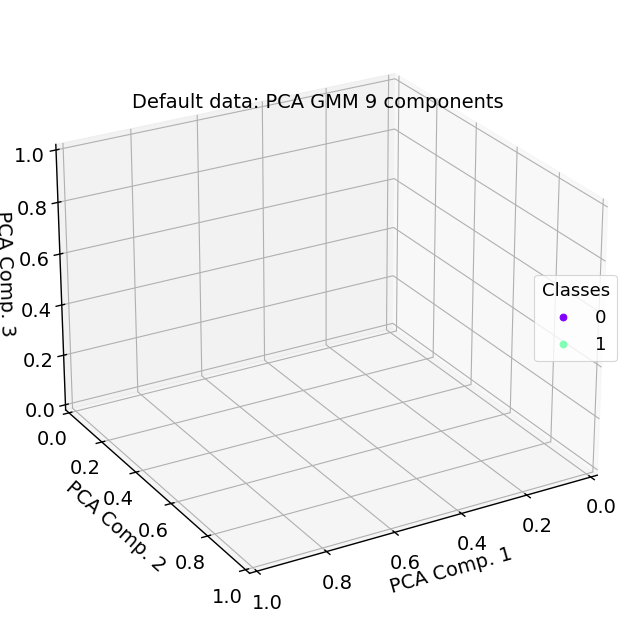

In [308]:
X = X_train_pca
n_components = 9
covariance_type='full'

tic = time.perf_counter()
gm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, max_iter=1000, tol=1e-4, n_init=10, random_state=seed).fit(X)
toc = time.perf_counter()
print('Train time', toc-tic)

gm_labels = gm.predict(X)

cluster_labels = gm_labels

results=['gmm', f'n_comp={n_components}']
# Define the metrics which require only the true labels and estimator labels
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]
results += [m(y_train, cluster_labels) for m in clustering_metrics]

# The silhouette score requires the full dataset
results += [metrics.silhouette_score(X, cluster_labels)]
# Show the results
formatter_result = (
    "{:9s}\t{:9s}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
)
print(82 * "_")
print("algo\t\tcomponents\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")
print(formatter_result.format(*results))

fig = plt.figure(1, figsize=(8, 8))

ax = fig.add_subplot(111,projection="3d", elev=25, azim=60)

#ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(cluster_labels)], loc='center right', title="Clusters", fontsize=fontsize,title_fontsize=fontsize)
plt.rcParams['axes.titley'] = 1.0
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')
ax.legend(scatter.legend_elements()[0], ['0', '1'], loc='center right', title="Classes")

plt.rcParams['axes.titley'] = 0.9

#ax.set_ylim((-2,10))
ax.set_xlabel("PCA Comp. 1")
ax.set_ylabel("PCA Comp. 2")
ax.set_zlabel("PCA Comp. 3")
ax.set_title(f"Default data: PCA GMM {n_components} components")

plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()

#### 2) ICA

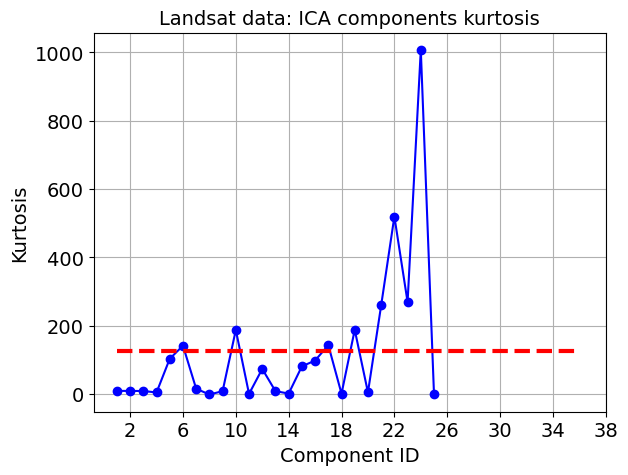

[ 5  9 16 18 20 21 22 23]
(8, 25)


In [102]:
X_train=X_train_orig
ica_components = X_train.shape[1]
#ica_components = 10
ica = FastICA(n_components=ica_components, random_state=seed)
X_train_ica = ica.fit_transform(X_train)  

kurtosis_scores = [kurtosis(X_train_ica[:, i]) for i in range(X_train_ica.shape[1])]

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range(1, ica_components+1), kurtosis_scores,'-o', color='b')
ax.plot([1, 36], [np.mean(np.abs(kurtosis_scores)), np.mean(np.abs(kurtosis_scores))],'--r',linewidth=3)
ax.tick_params(labelsize=fontsize)
ax.set_title('Landsat data: ICA components kurtosis', fontsize=fontsize)
ax.set_xlabel('Component ID', fontsize=fontsize) 
ax.set_ylabel('Kurtosis', fontsize=fontsize)
ax.set_xticks(range(2,40,4))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)

threshold = np.mean(np.abs(kurtosis_scores))
#threshold = 4

selected_indices = np.where(np.abs(kurtosis_scores) > threshold)[0]
print(selected_indices)

X_train_ica = X_train_ica[:, selected_indices]

C_matrix = ica.components_[selected_indices, :]

print(C_matrix.shape)

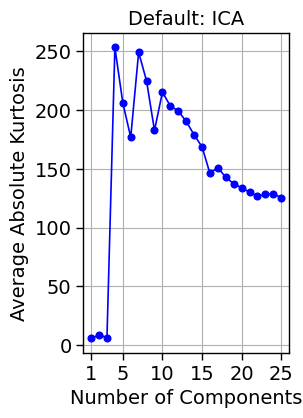

Maximum avg. kurtosis at number of components: 4


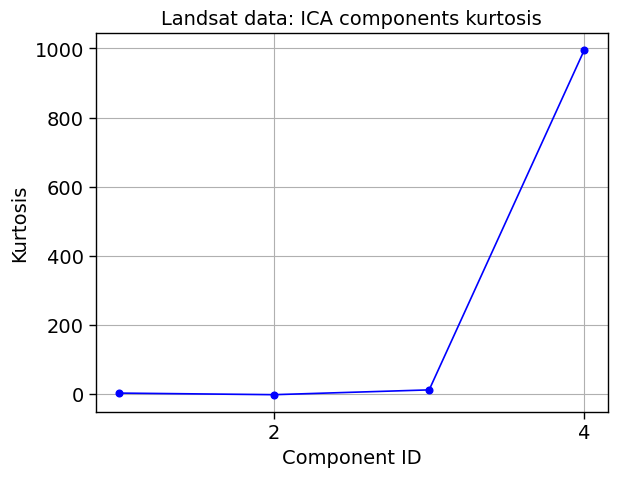

Time to train 0.05143740004859865
Normalized reconstruction error 0.645883320563044


In [277]:
X_train=X_train_orig

# 2nd approach take mean of kurtosis
aver_kurt = []
for ica_components in range(1,X_train.shape[1]+1):
    kurtosis_scores = []
    ica = FastICA(n_components=ica_components, random_state=seed)
    tmp = ica.fit_transform(X_train)
    kurtosis_scores = [np.abs(kurtosis(tmp[:, i])) for i in range(ica_components)]
    aver_kurt.append(np.mean(kurtosis_scores))

fontsize = 14
fig = plt.figure(figsize=(2.9,4))
ax = fig.add_axes([0.25, 0.14, 0.71, 0.80])
ax.plot(range(1,X_train.shape[1]+1), aver_kurt,'-o', color='blue')
ax.tick_params(labelsize=fontsize)
ax.set_title('Default: ICA', fontsize=fontsize)
ax.set_xlabel('Number of Components', fontsize=fontsize) 
ax.set_ylabel('Average Absolute Kurtosis', fontsize=fontsize)
ax.set_xticks([1]+list(range(5,30,5)))
#ax.set_yticks(np.arange(0.2,1.1,0.1))
ax.set_xlim((0,26))
#ax.set_ylim((0.2,1.02))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
fig.savefig('Default_ICA_kurtosis.png')
plt.close(fig)

ax.set_xticks([1]+list(range(5,30,5)))
ax.set_yticks(np.arange(0.2,1.1,0.1))
ax.set_xlim((0,26))
ax.set_ylim((0.2,1.02))

ica_components = np.argmax(aver_kurt)+1
#ica_components=5
print(f'Maximum avg. kurtosis at number of components: {ica_components}')

ica2 = FastICA(n_components=ica_components, random_state=seed)
X_train_ica2 = ica2.fit_transform(X_train)  

kurtosis_scores = [kurtosis(X_train_ica2[:, i]) for i in range(X_train_ica2.shape[1])]

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range(1, ica_components+1), kurtosis_scores,'-o', color='b')
ax.tick_params(labelsize=fontsize)
ax.set_title('Landsat data: ICA components kurtosis', fontsize=fontsize)
ax.set_xlabel('Component ID', fontsize=fontsize) 
ax.set_ylabel('Kurtosis', fontsize=fontsize)
ax.set_xticks(range(2,X_train_ica2.shape[1]+1,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)

ica2 = FastICA(n_components=4, random_state=seed)
tic = time.perf_counter()
ica2.fit(X_train) 
toc = time.perf_counter()
print('Time to train', toc-tic)
X_train_ica2 = ica2.transform(X_train) 
X_train_rec = X_train_ica2 @ np.transpose(ica2.mixing_)
norm_error = np.linalg.norm(X_train - X_train_rec)/np.linalg.norm(X_train)
print('Normalized reconstruction error', norm_error)

#ica3 = FastICA(n_components=7, random_state=seed)
#tic = time.perf_counter()
#ica3.fit(X_train) 
#toc = time.perf_counter()
#print('Time to train', toc-tic)
#X_train_ica3 = ica3.transform(X_train) 
#X_train_rec = X_train_ica3 @ np.transpose(ica3.mixing_)
#norm_error = np.linalg.norm(X_train - X_train_rec)/np.linalg.norm(X_train)
#print('Normalized reconstruction error', norm_error)
#
#ica4 = FastICA(n_components=16, random_state=seed)
#tic = time.perf_counter()
#ica4.fit(X_train) 
#toc = time.perf_counter()
#print('Time to train', toc-tic)
#X_train_ica4 = ica4.transform(X_train) 
#X_train_rec = X_train_ica4 @ np.transpose(ica4.mixing_)
#norm_error = np.linalg.norm(X_train - X_train_rec)/np.linalg.norm(X_train)
#print('Normalized reconstruction error', norm_error)


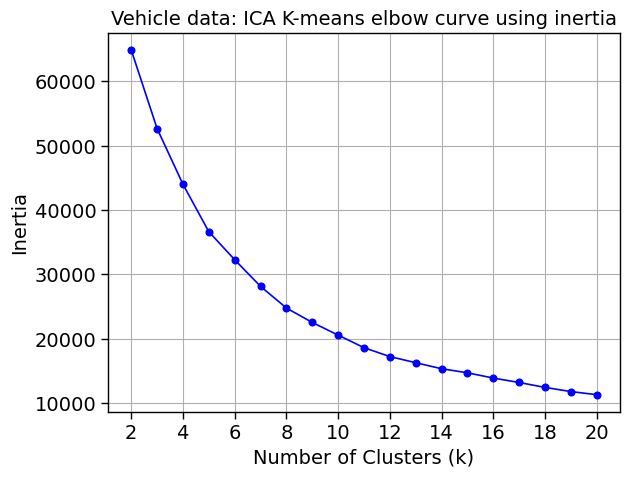

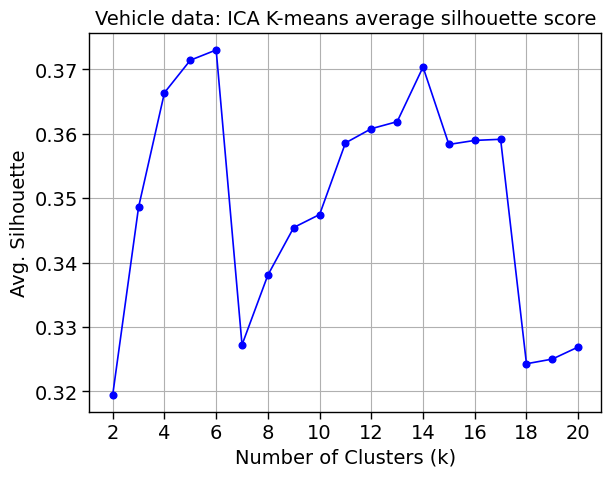

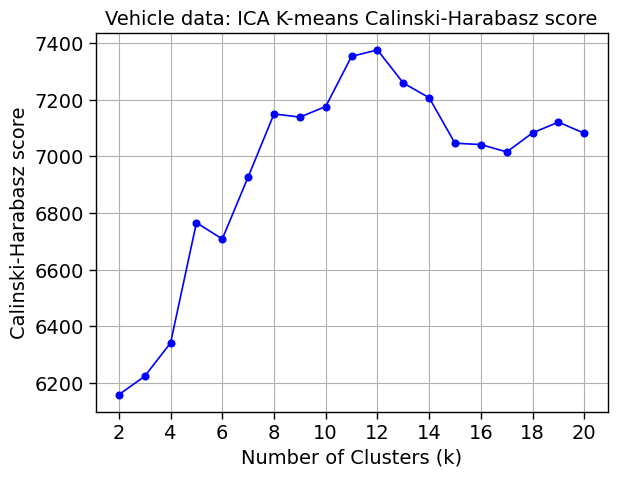

In [278]:
X_train = X_train_ica2

max_clusters = 20
inertias, silhouette_avg_scores, ch_scores = kmeans_tuning(X_train, max_clusters, seed)

range_n_clusters = list(range(2, max_clusters+1))

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range_n_clusters, inertias,'-o', color='b')

ax.tick_params(labelsize=fontsize)
ax.set_title('Vehicle data: ICA K-means elbow curve using inertia', fontsize=fontsize)
ax.set_xlabel('Number of Clusters (k)', fontsize=fontsize) 
ax.set_ylabel('Inertia', fontsize=fontsize)
ax.set_xticks(range(2,22,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range_n_clusters, silhouette_avg_scores,'-o', color='b')

ax.tick_params(labelsize=fontsize)
ax.set_title('Vehicle data: ICA K-means average silhouette score', fontsize=fontsize)
ax.set_xlabel('Number of Clusters (k)', fontsize=fontsize) 
ax.set_ylabel('Avg. Silhouette', fontsize=fontsize)
ax.set_xticks(range(2,22,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range_n_clusters, ch_scores,'-o', color='b')

ax.tick_params(labelsize=fontsize)
ax.set_title('Vehicle data: ICA K-means Calinski-Harabasz score', fontsize=fontsize)
ax.set_xlabel('Number of Clusters (k)', fontsize=fontsize) 
ax.set_ylabel('Calinski-Harabasz score', fontsize=fontsize)
ax.set_xticks(range(2,22,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)


K=4
For n_clusters = 4 The average silhouette_score is : 0.3663869729146605


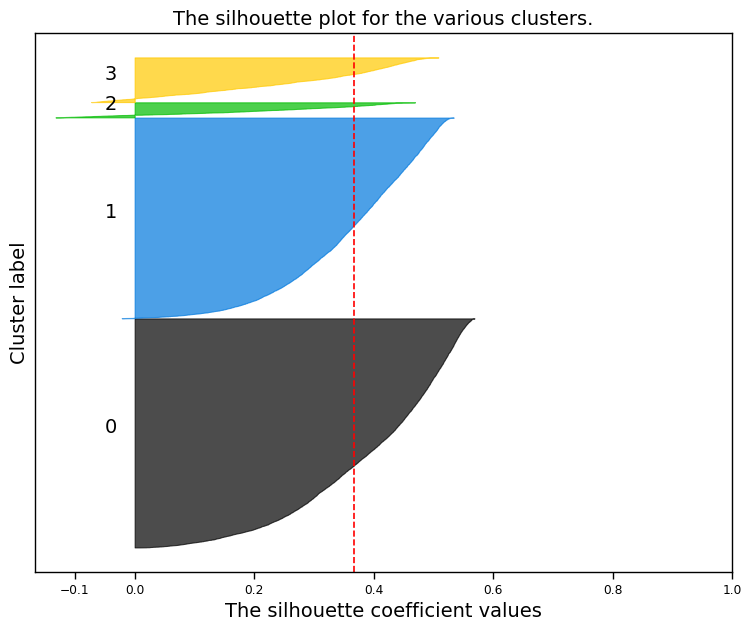

K=5
For n_clusters = 5 The average silhouette_score is : 0.37177810109176174


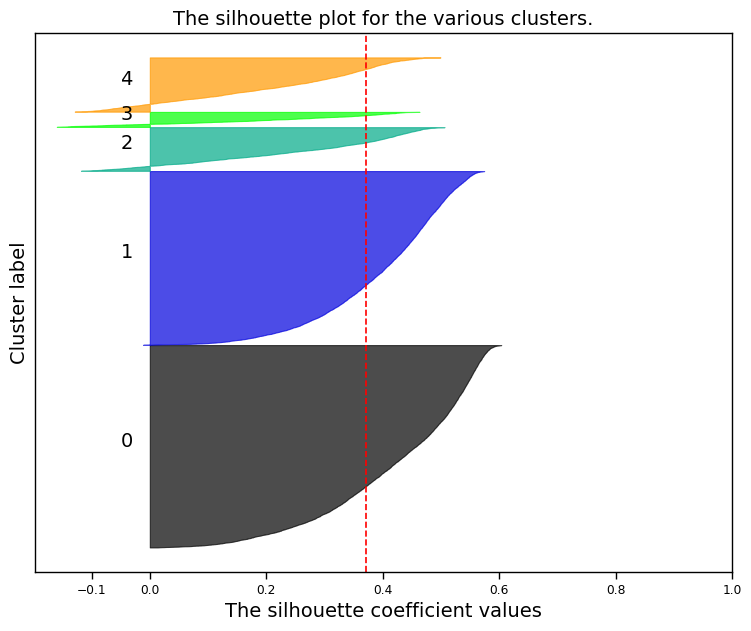

K=6
For n_clusters = 6 The average silhouette_score is : 0.3730210401650837


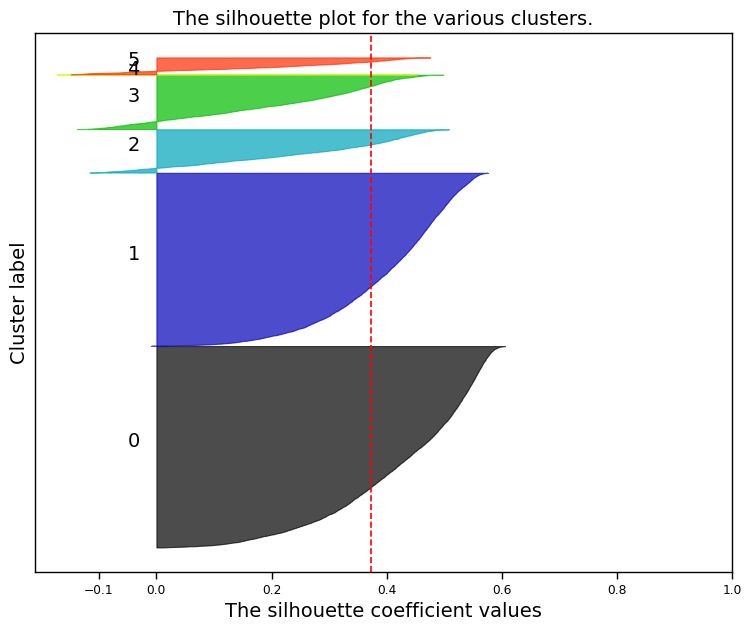

K=7
For n_clusters = 7 The average silhouette_score is : 0.3272416097172264


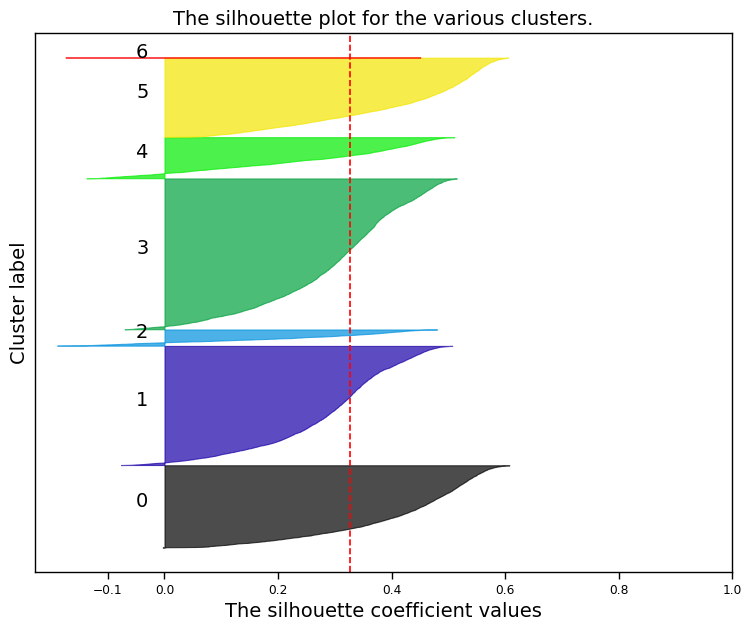

K=8
For n_clusters = 8 The average silhouette_score is : 0.3380713539393646


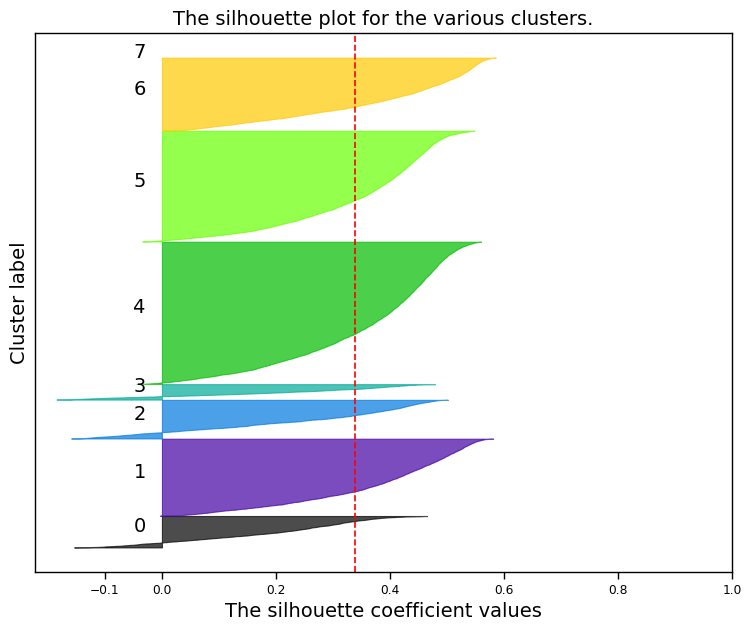

K=9
For n_clusters = 9 The average silhouette_score is : 0.34545470998022404


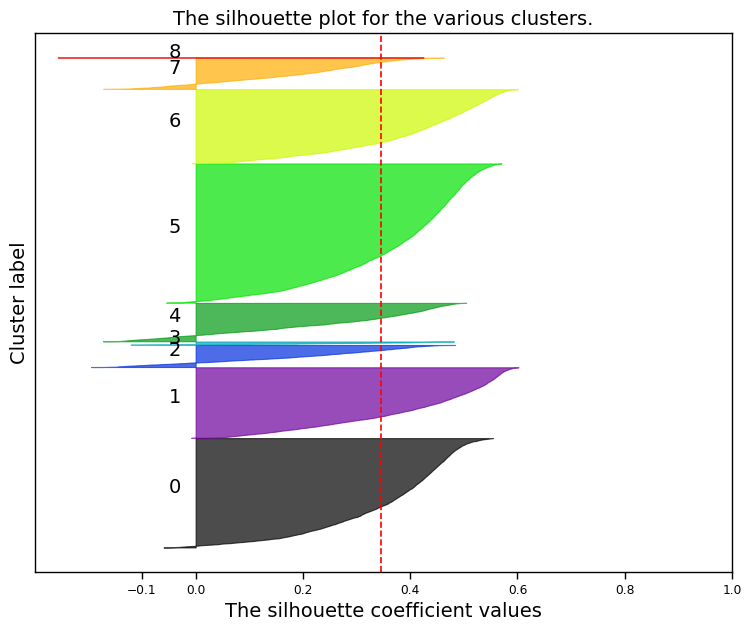

In [281]:
X = X_train_ica2

range_n_clusters = list(range(4,10))

for n_clusters in range_n_clusters:
    
    print(f'K={n_clusters}')
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=seed, max_iter=1000, n_init=10)
    cluster_labels = kmeans.fit_predict(X)
    
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_avg_scores.append(silhouette_avg)
    print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(9, 7)
    y_lower = 10
                                                  
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
        
    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.show()
    #fig.savefig('rhc_effect_max_attempts.png')
    plt.close(fig)

Train time 0.3070835000835359
__________________________________________________________________________________
algo		inertia		homo	compl	v-meas	ARI	AMI	silhouette
K=5      	36630.015	0.085	0.034	0.049	0.057	0.049	0.372


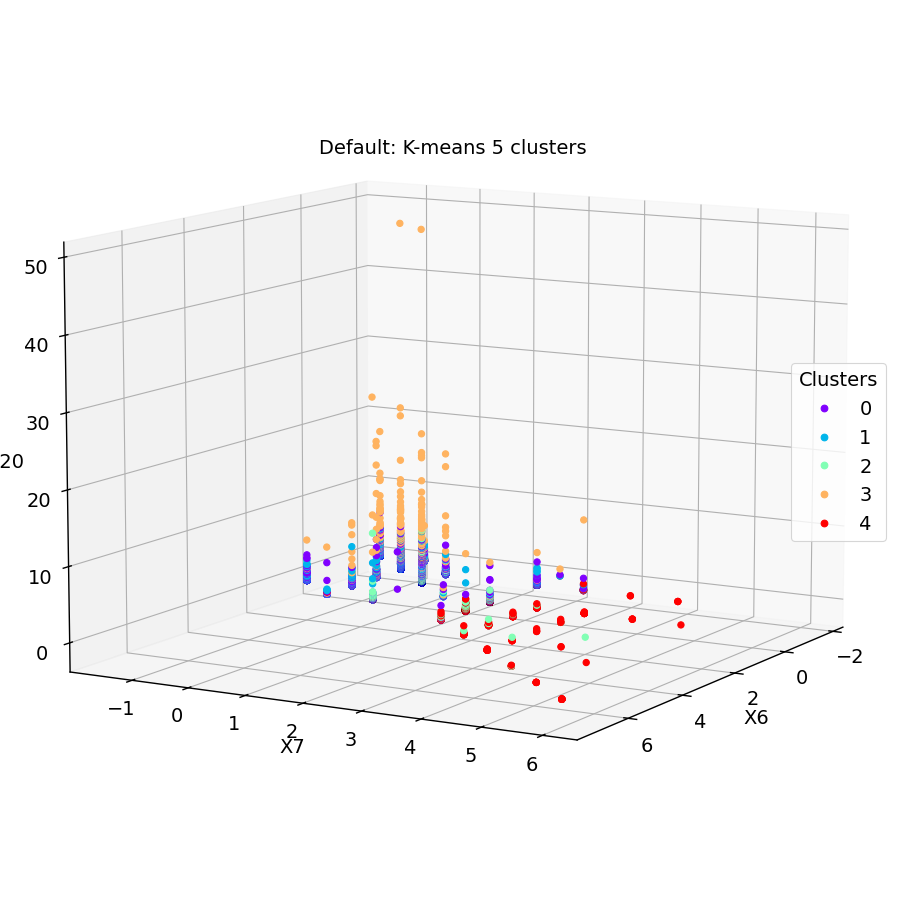

In [311]:
# K-means

X = X_train_ica2


# Predict clusters
method='K-means'
n_clusters=5
tic = time.perf_counter()
kmeans = KMeans(n_clusters=n_clusters, random_state=seed, max_iter=1000, n_init=10).fit(X)
toc = time.perf_counter()
print('Train time', toc-tic)
cluster_labels = kmeans.predict(X)
#
# --------------------------------------------------------------------------------
results=[f'K={n_clusters}', kmeans.inertia_]
# Define the metrics which require only the true labels and estimator labels
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]
results += [m(y_train, cluster_labels) for m in clustering_metrics]

# The silhouette score requires the full dataset
results += [metrics.silhouette_score(X, cluster_labels)]
# Show the results
formatter_result = (
    "{:9s}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
)
print(82 * "_")
print("algo\t\tinertia\t\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")
print(formatter_result.format(*results))
# --------------------------------------------------------------------------------
#
# Plot clusters
X_train = X_train_orig

fontsize = 14

elev=10
azim=30

fig = plt.figure(1, figsize=(11.5, 11.5))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)

plot3d_features = ["X6", "X7", "X20"]
col_X = [list(X_df.columns).index(x) for x in plot3d_features]
(X0, X1, X2) = (X_train[:, col_X[0]], X_train[:, col_X[1]], X_train[:, col_X[2]])
scatter = ax.scatter(X0, X1, X2, c=cluster_labels, cmap='rainbow', alpha=1)

ax.set_xlabel(plot3d_features[0], fontsize=fontsize)
ax.set_ylabel(plot3d_features[1], fontsize=fontsize,loc = "bottom")
ax.set_zlabel(plot3d_features[2], fontsize=fontsize)
ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(cluster_labels)], loc='center right', title="Clusters", fontsize=fontsize,title_fontsize=fontsize)
plt.rcParams['axes.titley'] = 0.90
#ax.set_ylim((-2, 5))
#ax.set_zlim((-5, 30))
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()
#fig.savefig(f'{data_name}_{method}_{n_clusters}clusters.png')
#
#plt.savefig(f'{data_name}_{method}_{n_clusters}clusters_barplot.png')
#

## Predict test set
#pred_test_labels = kmeans.predict(X_test)
#
#np.savetxt(f"{data_name}_{method}_{n_clusters}k_train_labels_{case}.csv", cluster_labels)
#np.savetxt(f"{data_name}_{method}_{n_clusters}k_test_labels_{case}.csv" , pred_test_labels)


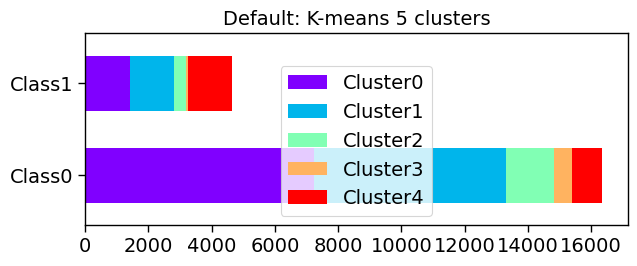

In [290]:
# Bar plot counts
true_classes = list(set(y_train))
df_counts = pd.DataFrame(index=[f'Class{c}' for c in true_classes])
for cluster in set(cluster_labels): 
    unique_values, counts = np.unique(y_train[cluster_labels==cluster], return_counts=True)
    temp = [0]*len(true_classes)
    for i in range(len(unique_values)):
        temp[true_classes.index(unique_values[i])] = counts[i]    
    df_counts[f'Cluster{cluster}'] = temp
ax = df_counts.plot.barh(stacked=True, width=0.6, cmap='rainbow',figsize=(7, 2.5))
plt.rcParams['axes.titley'] = 1.0
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.legend(fontsize=fontsize)
plt.show()

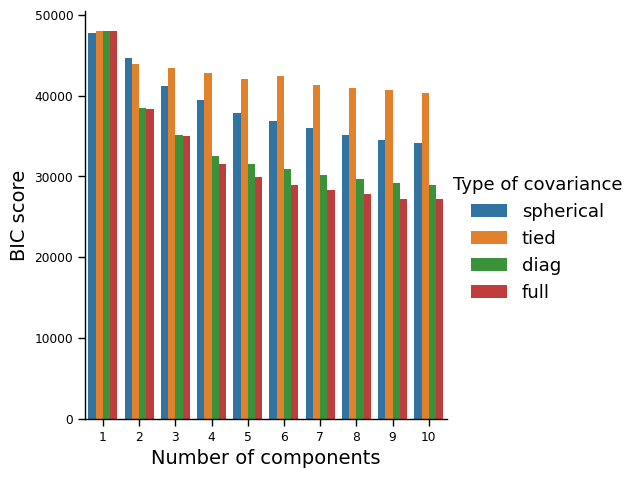

,Number of components,Type of covariance,BIC score
39,10,full,27181.522471
38,9,full,27215.439783
37,8,full,27787.660096
36,7,full,28356.472447
35,6,full,28942.528350


In [291]:
## GMM
X = X_train_ica2

def gmm_bic_score(estimator, X):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(X)


param_grid = {
    "n_components": range(1, 11),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}
grid_search = GridSearchCV(
    GaussianMixture(max_iter=1000, tol=1e-4, n_init=10, random_state=seed), param_grid=param_grid, scoring=gmm_bic_score, n_jobs=8
)
grid_search.fit(X)

df = pd.DataFrame(grid_search.cv_results_)[
    ["param_n_components", "param_covariance_type", "mean_test_score"]
]
df["mean_test_score"] = -df["mean_test_score"]
df = df.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "BIC score",
    }
)

sns.catplot(
    data=df,
    kind="bar",
    x="Number of components",
    y="BIC score",
    hue="Type of covariance",
)
plt.show()

df.sort_values(by="BIC score").head()

Train time 8.139337899978273
__________________________________________________________________________________
algo		components	homo	compl	v-meas	ARI	AMI	silhouette
gmm      	n_comp=6 	0.053	0.016	0.024	0.020	0.024	0.144


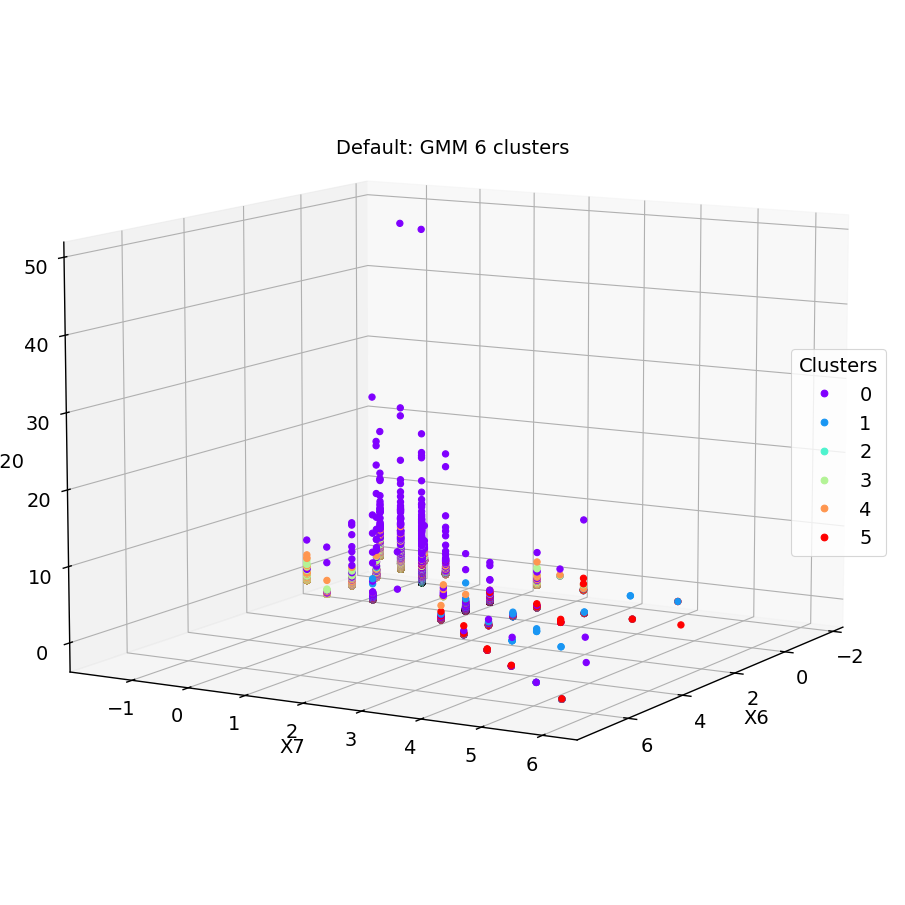

In [313]:
X = X_train_ica2

method='GMM'
n_clusters = 6
covariance_type='full'

tic = time.perf_counter()
gm = GaussianMixture(n_components=n_clusters, covariance_type=covariance_type, max_iter=1000, tol=1e-4, n_init=10, random_state=seed).fit(X)
toc = time.perf_counter()
print('Train time', toc-tic)
gm_labels = gm.predict(X)

cluster_labels = gm_labels

results=['gmm', f'n_comp={n_clusters}']
# Define the metrics which require only the true labels and estimator labels
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]
results += [m(y_train, cluster_labels) for m in clustering_metrics]

# The silhouette score requires the full dataset
results += [metrics.silhouette_score(X, cluster_labels)]
# Show the results
formatter_result = (
    "{:9s}\t{:9s}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
)
print(82 * "_")
print("algo\t\tcomponents\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")
print(formatter_result.format(*results))

# Plot clusters
X_train = X_train_orig

fontsize = 14

elev=10
azim=30

fig = plt.figure(1, figsize=(11.5, 11.5))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)

plot3d_features = ["X6", "X7", "X20"]
col_X = [list(X_df.columns).index(x) for x in plot3d_features]
(X0, X1, X2) = (X_train[:, col_X[0]], X_train[:, col_X[1]], X_train[:, col_X[2]])
scatter = ax.scatter(X0, X1, X2, c=cluster_labels, cmap='rainbow', alpha=1)

ax.set_xlabel(plot3d_features[0], fontsize=fontsize)
ax.set_ylabel(plot3d_features[1], fontsize=fontsize,loc = "bottom")
ax.set_zlabel(plot3d_features[2], fontsize=fontsize)
ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(cluster_labels)], loc='center right', title="Clusters", fontsize=fontsize,title_fontsize=fontsize)
plt.rcParams['axes.titley'] = 0.90
#ax.set_ylim((-2, 5))
#ax.set_zlim((-5, 30))
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()
#fig.savefig(f'{data_name}_{method}_{n_clusters}clusters.png')
#

## Predict test set
#pred_test_labels = gm.predict(X_test)
#
#np.savetxt(f"{data_name}_{method}_{n_clusters}k_train_labels_{case}.csv", gm.predict_proba(X_train))
#np.savetxt(f"{data_name}_{method}_{n_clusters}k_test_labels_{case}.csv" , gm.predict_proba(X_test))

#### 3) RCA

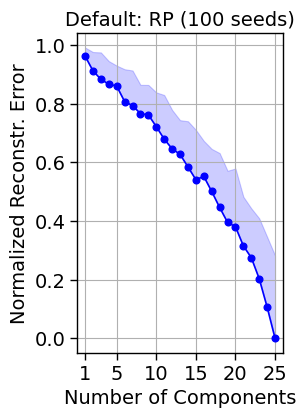

In [243]:
X_train = X_train_orig
max_dims = X_train.shape[1]
df = pd.DataFrame(columns = ['dims', 'seed', 'error'])

for dims, i in product(range(1, max_dims+1), range(100)):

    rp = SparseRandomProjection(random_state=i, n_components=dims, compute_inverse_components = True)
#    rp = GaussianRandomProjection(random_state=i, n_components=dims, compute_inverse_components = True)
    rp.fit(X_train)
    X_train_rf = rp.transform(X_train)
    X_train_rec = X_train_rf @ np.transpose(rp.inverse_components_)
    norm_error = np.linalg.norm(X_train - X_train_rec)/np.linalg.norm(X_train)
    df.loc[len(df.index)] = [dims, i, norm_error]

min_error_per_dim = df.groupby(['dims'])['error'].min()
max_error_per_dim = df.groupby(['dims'])['error'].max()

fontsize = 14
fig = plt.figure(figsize=(2.9,4))
ax = fig.add_axes([0.25, 0.14, 0.71, 0.80])
ax.plot(range(1, max_dims+1), min_error_per_dim.values,'-o', color='blue')
ax.fill_between(range(1, max_dims+1), min_error_per_dim.values, max_error_per_dim.values, alpha=0.2, color='blue')
ax.tick_params(labelsize=fontsize)
ax.set_title('Default: RP (100 seeds)', fontsize=fontsize)
ax.set_xlabel('Number of Components', fontsize=fontsize) 
ax.set_ylabel('Normalized Reconstr. Error', fontsize=fontsize)
ax.set_xticks([1]+list(range(5,30,5)))
#ax.set_yticks(np.arange(0.2,1.1,0.1))
ax.set_xlim((0,26))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
fig.savefig('Default_RP_error.png')
plt.close(fig)


#fontsize = 14
#fig = plt.figure(figsize=(2.9,4))
#ax = fig.add_axes([0.25, 0.14, 0.71, 0.80])
#ax.plot(range(1,X_train.shape[1]+1), aver_kurt,'-o', color='blue')
#ax.tick_params(labelsize=fontsize)
#ax.set_title('Default: ICA', fontsize=fontsize)
#ax.set_xlabel('Number of Components', fontsize=fontsize) 
#ax.set_ylabel('Average Absolute Kurtosis', fontsize=fontsize)
#ax.set_xticks([1]+list(range(5,30,5)))
##ax.set_yticks(np.arange(0.2,1.1,0.1))
#ax.set_xlim((0,26))
##ax.set_ylim((0.2,1.02))
#plt.rcParams['axes.titley'] = 1.0
#plt.grid(True)
#plt.show()
#fig.savefig('Default_ICA_kurtosis.png')
#plt.close(fig)

In [255]:
X_train_orig.shape

(20975, 25)

In [249]:
X_train = X_train_orig

selected_dim = 23
best_seed = int(df[df['dims']==selected_dim].sort_values('error')['seed'].iloc[0])

rp = SparseRandomProjection(random_state=best_seed, n_components=selected_dim, compute_inverse_components = True)
#    rp = GaussianRandomProjection(random_state=i, n_components=dims, compute_inverse_components = True)
tic = time.perf_counter()
rp.fit(X_train)
toc = time.perf_counter()
print('Time to train', toc-tic)
X_train_rp = rp.transform(X_train)

X_train_rec = X_train_rp @ np.transpose(rp.inverse_components_)
norm_error = np.linalg.norm(X_train - X_train_rec)/np.linalg.norm(X_train)
print('Normalized reconstruction error', norm_error)

Time to train 0.002775800006929785
Normalized reconstruction error 0.2033440426169899


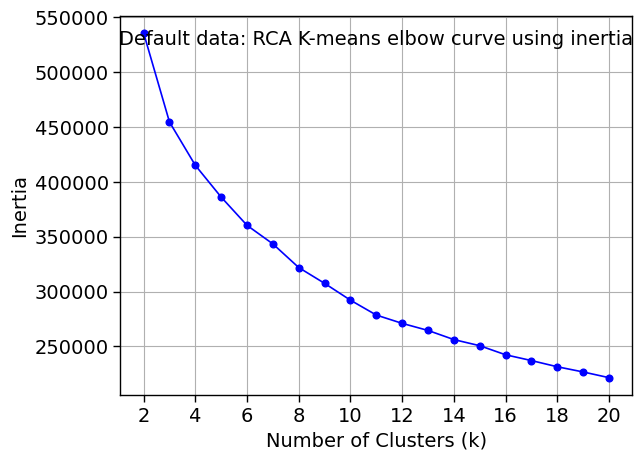

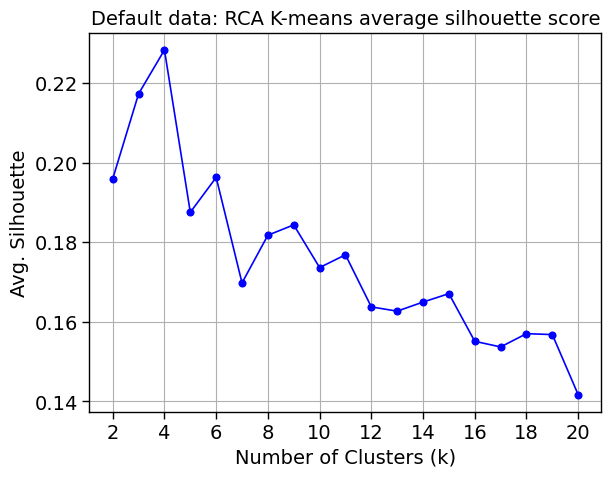

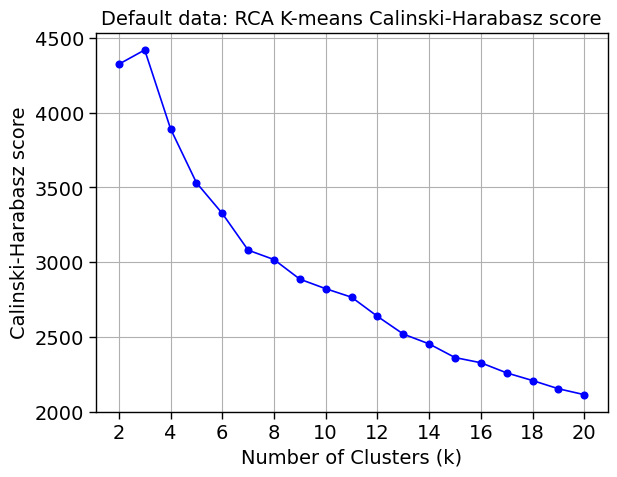

In [294]:
X_train = X_train_rp

max_clusters = 20
inertias, silhouette_avg_scores, ch_scores = kmeans_tuning(X_train, max_clusters, seed)

range_n_clusters = list(range(2, max_clusters+1))

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range_n_clusters, inertias,'-o', color='b')

ax.tick_params(labelsize=fontsize)
ax.set_title('Default data: RCA K-means elbow curve using inertia', fontsize=fontsize)
ax.set_xlabel('Number of Clusters (k)', fontsize=fontsize) 
ax.set_ylabel('Inertia', fontsize=fontsize)
ax.set_xticks(range(2,22,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range_n_clusters, silhouette_avg_scores,'-o', color='b')

ax.tick_params(labelsize=fontsize)
ax.set_title('Default data: RCA K-means average silhouette score', fontsize=fontsize)
ax.set_xlabel('Number of Clusters (k)', fontsize=fontsize) 
ax.set_ylabel('Avg. Silhouette', fontsize=fontsize)
ax.set_xticks(range(2,22,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)

fontsize = 14
fig = plt.figure()
ax = fig.add_axes([0.15, 0.14, 0.80, 0.79])
ax.plot(range_n_clusters, ch_scores,'-o', color='b')

ax.tick_params(labelsize=fontsize)
ax.set_title('Default data: RCA K-means Calinski-Harabasz score', fontsize=fontsize)
ax.set_xlabel('Number of Clusters (k)', fontsize=fontsize) 
ax.set_ylabel('Calinski-Harabasz score', fontsize=fontsize)
ax.set_xticks(range(2,22,2))
plt.rcParams['axes.titley'] = 1.0
plt.grid(True)
plt.show()
#fig.savefig('rhc_effect_max_attempts.png')
plt.close(fig)


K=3
For n_clusters = 3 The average silhouette_score is : 0.21715127940601345


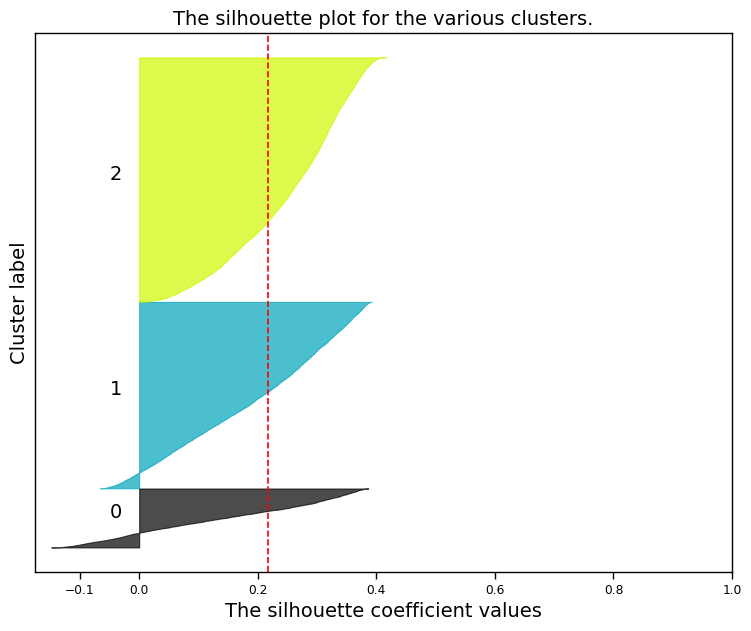

K=4
For n_clusters = 4 The average silhouette_score is : 0.16394415319838768


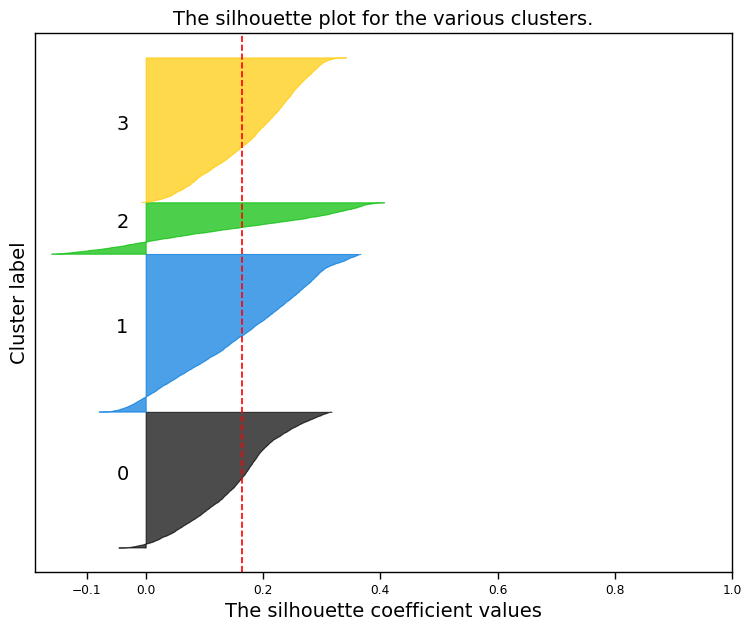

K=5
For n_clusters = 5 The average silhouette_score is : 0.1875068820482761


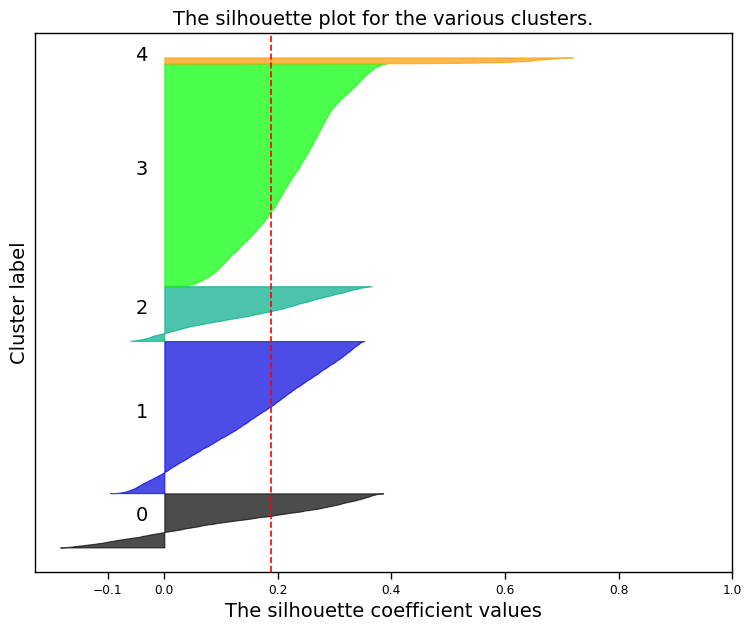

In [295]:
X = X_train_rp

range_n_clusters = list(range(3, 6))

for n_clusters in range_n_clusters:
    
    print(f'K={n_clusters}')
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=seed, max_iter=1000, n_init=10)
    cluster_labels = kmeans.fit_predict(X)
    
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_avg_scores.append(silhouette_avg)
    print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(9, 7)
    y_lower = 10
                                                  
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
        
    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.show()
    #fig.savefig('rhc_effect_max_attempts.png')
    plt.close(fig)

Train time 0.2776254001073539
__________________________________________________________________________________
algo		inertia		homo	compl	v-meas	ARI	AMI	silhouette
K=3      	454615.601	0.025	0.014	0.018	-0.007	0.018	0.217


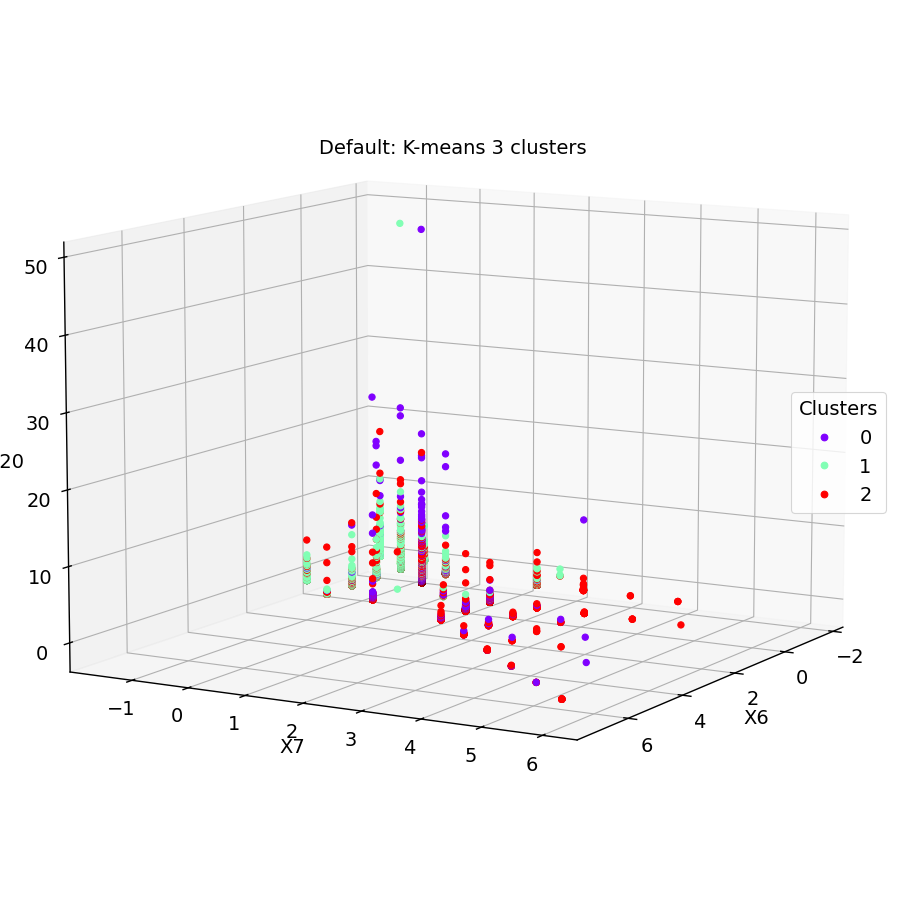

In [314]:
# K-means

X = X_train_rp


# Predict clusters
method='K-means'
n_clusters=3
tic = time.perf_counter()
kmeans = KMeans(n_clusters=n_clusters, random_state=seed, max_iter=1000, n_init=10).fit(X)
toc = time.perf_counter()
print('Train time', toc-tic)
cluster_labels = kmeans.predict(X)
#
# --------------------------------------------------------------------------------
results=[f'K={n_clusters}', kmeans.inertia_]
# Define the metrics which require only the true labels and estimator labels
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]
results += [m(y_train, cluster_labels) for m in clustering_metrics]

# The silhouette score requires the full dataset
results += [metrics.silhouette_score(X, cluster_labels)]
# Show the results
formatter_result = (
    "{:9s}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
)
print(82 * "_")
print("algo\t\tinertia\t\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")
print(formatter_result.format(*results))
# --------------------------------------------------------------------------------
#
# Plot clusters
X_train = X_train_orig

fontsize = 14

elev=10
azim=30

fig = plt.figure(1, figsize=(11.5, 11.5))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)

plot3d_features = ["X6", "X7", "X20"]
col_X = [list(X_df.columns).index(x) for x in plot3d_features]
(X0, X1, X2) = (X_train[:, col_X[0]], X_train[:, col_X[1]], X_train[:, col_X[2]])
scatter = ax.scatter(X0, X1, X2, c=cluster_labels, cmap='rainbow', alpha=1)

ax.set_xlabel(plot3d_features[0], fontsize=fontsize)
ax.set_ylabel(plot3d_features[1], fontsize=fontsize,loc = "bottom")
ax.set_zlabel(plot3d_features[2], fontsize=fontsize)
ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(cluster_labels)], loc='center right', title="Clusters", fontsize=fontsize,title_fontsize=fontsize)
plt.rcParams['axes.titley'] = 0.90
#ax.set_ylim((-2, 5))
#ax.set_zlim((-5, 30))
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()
#fig.savefig(f'{data_name}_{method}_{n_clusters}clusters.png')
#
#plt.savefig(f'{data_name}_{method}_{n_clusters}clusters_barplot.png')
#

## Predict test set
#pred_test_labels = kmeans.predict(X_test)
#
#np.savetxt(f"{data_name}_{method}_{n_clusters}k_train_labels_{case}.csv", cluster_labels)
#np.savetxt(f"{data_name}_{method}_{n_clusters}k_test_labels_{case}.csv" , pred_test_labels)


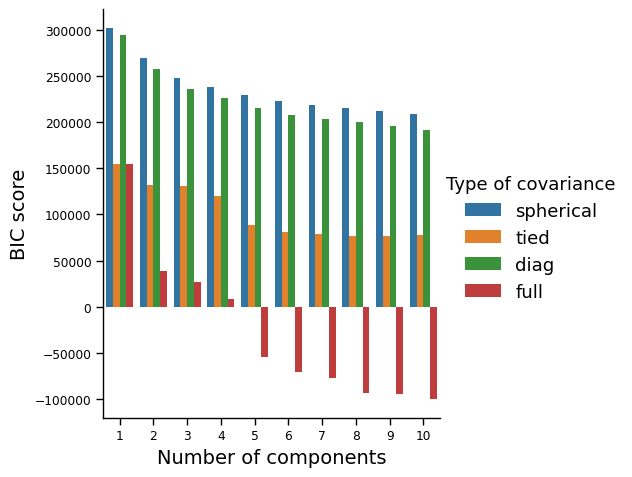

,Number of components,Type of covariance,BIC score
39,10,full,-100282.121395
38,9,full,-94623.146482
37,8,full,-92995.053012
36,7,full,-77015.843363
35,6,full,-70796.387874


In [297]:
## GMM
X = X_train_rp

def gmm_bic_score(estimator, X):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(X)


param_grid = {
    "n_components": range(1, 11),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}
grid_search = GridSearchCV(
    GaussianMixture(max_iter=1000, tol=1e-4, n_init=10, random_state=seed), param_grid=param_grid, scoring=gmm_bic_score, n_jobs=8
)
grid_search.fit(X)

df = pd.DataFrame(grid_search.cv_results_)[
    ["param_n_components", "param_covariance_type", "mean_test_score"]
]
df["mean_test_score"] = -df["mean_test_score"]
df = df.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "BIC score",
    }
)

sns.catplot(
    data=df,
    kind="bar",
    x="Number of components",
    y="BIC score",
    hue="Type of covariance",
)
plt.show()

df.sort_values(by="BIC score").head()

Train time 54.795675199944526
__________________________________________________________________________________
algo		components	homo	compl	v-meas	ARI	AMI	silhouette
gmm      	n_comp=8 	0.077	0.022	0.034	0.034	0.033	0.016


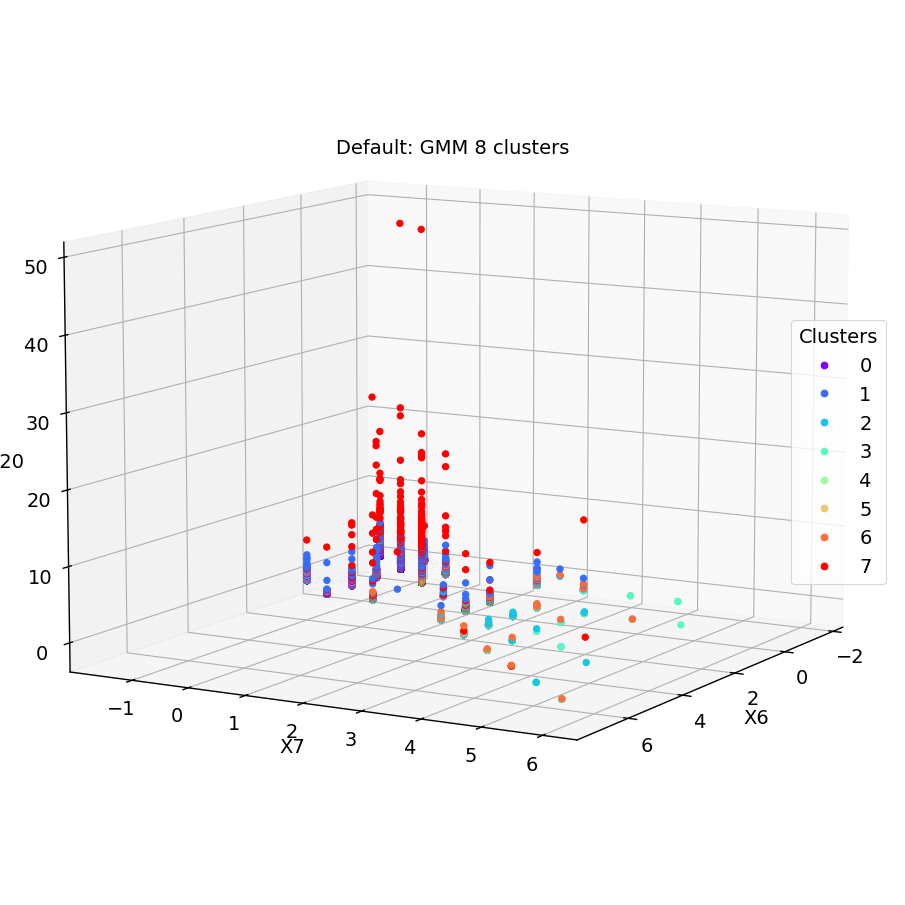

In [316]:
X = X_train_rp

method='GMM'
n_clusters = 8
covariance_type='full'

tic = time.perf_counter()
gm = GaussianMixture(n_components=n_clusters, covariance_type=covariance_type, max_iter=1000, tol=1e-4, n_init=10, random_state=seed).fit(X)
toc = time.perf_counter()
print('Train time', toc-tic)
gm_labels = gm.predict(X)

cluster_labels = gm_labels

results=['gmm', f'n_comp={n_clusters}']
# Define the metrics which require only the true labels and estimator labels
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]
results += [m(y_train, cluster_labels) for m in clustering_metrics]

# The silhouette score requires the full dataset
results += [metrics.silhouette_score(X, cluster_labels)]
# Show the results
formatter_result = (
    "{:9s}\t{:9s}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
)
print(82 * "_")
print("algo\t\tcomponents\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")
print(formatter_result.format(*results))

# Plot clusters
X_train = X_train_orig

fontsize = 14

elev=10
azim=30

fig = plt.figure(1, figsize=(11.5, 11.5))
ax = fig.add_subplot(111,projection="3d", elev=elev, azim=azim)

plot3d_features = ["X6", "X7", "X20"]
col_X = [list(X_df.columns).index(x) for x in plot3d_features]
(X0, X1, X2) = (X_train[:, col_X[0]], X_train[:, col_X[1]], X_train[:, col_X[2]])
scatter = ax.scatter(X0, X1, X2, c=cluster_labels, cmap='rainbow', alpha=1)

ax.set_xlabel(plot3d_features[0], fontsize=fontsize)
ax.set_ylabel(plot3d_features[1], fontsize=fontsize,loc = "bottom")
ax.set_zlabel(plot3d_features[2], fontsize=fontsize)
ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(cluster_labels)], loc='center right', title="Clusters", fontsize=fontsize,title_fontsize=fontsize)
plt.rcParams['axes.titley'] = 0.90
#ax.set_ylim((-2, 5))
#ax.set_zlim((-5, 30))
ax.set_title(f"{data_name}: {method} {n_clusters} clusters", fontsize=fontsize)
ax.tick_params(labelsize=fontsize, direction='in', length=3, width=2, colors='black')
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()
#fig.savefig(f'{data_name}_{method}_{n_clusters}clusters.png')
#

## Predict test set
#pred_test_labels = gm.predict(X_test)
#
#np.savetxt(f"{data_name}_{method}_{n_clusters}k_train_labels_{case}.csv", gm.predict_proba(X_train))
#np.savetxt(f"{data_name}_{method}_{n_clusters}k_test_labels_{case}.csv" , gm.predict_proba(X_test))

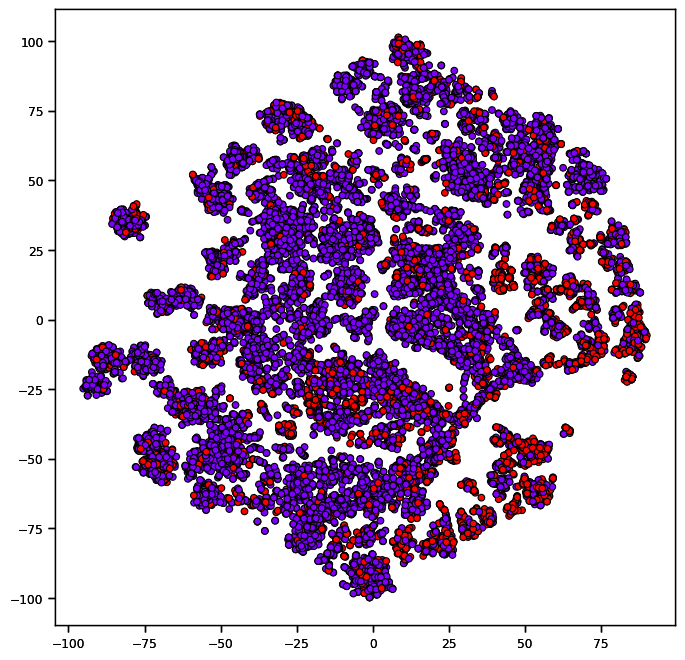

In [358]:
X_train = X_train_orig

t_sne = manifold.TSNE(
    n_components=2,
    perplexity=50,
    init="random",
    random_state=seed,
)
S_t_sne = t_sne.fit_transform(X_train)


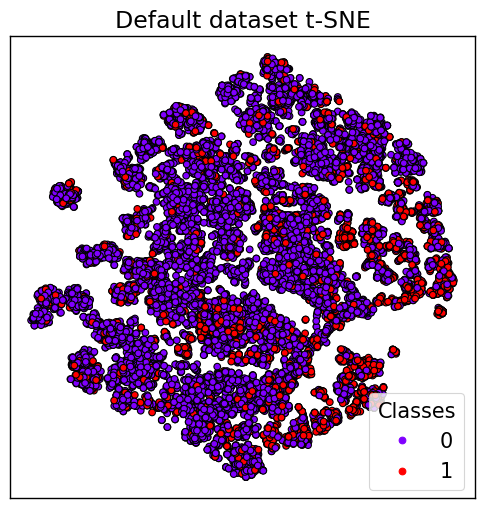

In [363]:
fig = plt.figure(1, figsize=(6, 6))
ax = fig.add_subplot(111)
scatter = ax.scatter(S_t_sne[:, 0], S_t_sne[:, 1], c=y_train, cmap='rainbow', edgecolor="k", alpha=1)
ax.legend(scatter.legend_elements()[0], [f'{c}' for c in set(y_train)], bbox_to_anchor=(0.75,0.25), title="Classes", fontsize=15,title_fontsize=15)
ax.set_title('Default dataset t-SNE', fontsize=17)
#plt.rcParams['axes.titley'] =1
ax.set_xticks([])
ax.set_yticks([])
plt.savefig(f'{data_name}_tSNE.png')
plt.show()
